In [1]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_blobs
from scipy.stats import multivariate_normal
from scipy.optimize import linear_sum_assignment
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
from sklearn.cluster import KMeans, SpectralClustering, Birch
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import NearestNeighbors
from pyclustering.cluster.kmedoids import kmedoids
from pyclustering.utils import distance_metric, type_metric
from sklearn.metrics import confusion_matrix, classification_report, adjusted_rand_score, normalized_mutual_info_score, silhouette_score
from matplotlib.lines import Line2D
import warnings
warnings.filterwarnings("ignore", category=UserWarning) 
warnings.filterwarnings("ignore", message="'force_all_finite' was renamed")
from main import CorrelatedClusterGenerator, evaluate_clustering, create_cluster_dataset

# data

In [2]:
np.random.seed(42)

In [3]:
N_CLUSTER = 3

In [4]:
CORRELATION = 0.1

In [5]:
NOISE_STD = 12

In [6]:
N_SAMPLE = 5000

In [7]:
N_FEATURES = 20

In [8]:
X = create_cluster_dataset(n_samples=N_SAMPLE,
                             n_features=N_FEATURES,
                             n_clusters=N_CLUSTER,
                             correlation=CORRELATION,
                             noise_std=NOISE_STD,
                             cluster_std=[5.0, 10.0, 15.0],
                             separation_factor=2.0,
                             sample_distribution=[2500, 1500, 1000],
                             random_state=42)

In [9]:
X.shape

(5000, 21)

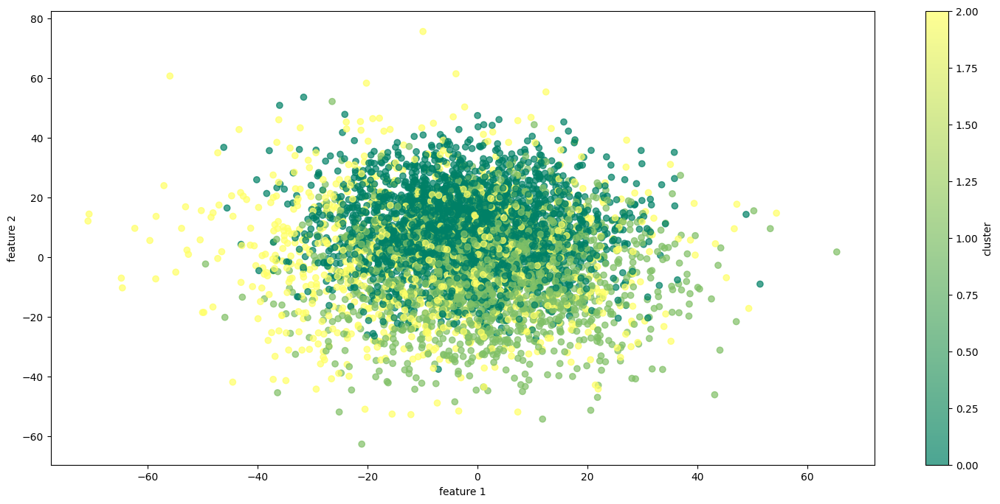

In [10]:
plt.figure(figsize=(18,8))
plt.scatter(X['var_1'],X['var_2'],c=X['target'],cmap='summer',alpha=0.7)
plt.xlabel("feature 1")
plt.ylabel("feature 2")
plt.colorbar(label="cluster")
plt.show()

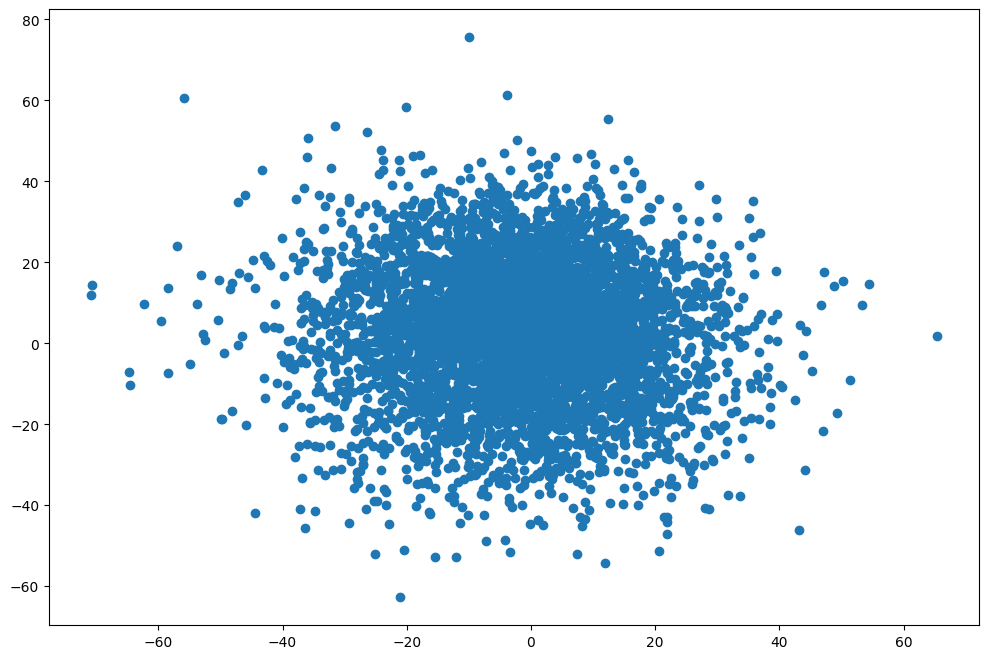

In [11]:
plt.figure(figsize=(12,8))
plt.scatter(X['var_1'],X['var_2'])
plt.show()

In [12]:
corr_dataset = pd.DataFrame(X) 

## correlation matrix

In [13]:
corr_dataset.iloc[:,:-1].corr()

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20
var_1,1.000000,-0.050896,-0.001422,-0.063209,0.052458,0.044619,-0.059090,-0.032269,-0.006180,-0.033033,-0.073176,-0.069414,-0.115482,-0.013258,-0.007824,-0.024402,0.051695,-0.002463,0.055945,0.004086
var_2,-0.050896,1.000000,0.098458,0.058468,-0.119879,-0.197605,-0.041892,0.134096,0.009118,0.145465,-0.090973,0.159496,0.181926,-0.144374,-0.160528,-0.136516,-0.020671,0.088202,-0.021677,-0.011758
var_3,-0.001422,0.098458,1.000000,-0.056963,-0.045960,-0.123649,-0.056563,0.067562,0.021475,0.119202,-0.134353,0.063774,0.067100,-0.116235,-0.085435,-0.157741,0.027384,0.076933,0.063056,-0.034356
var_4,-0.063209,0.058468,-0.056963,1.000000,-0.060550,-0.016653,0.012797,-0.004353,-0.005267,0.027976,0.054392,0.088259,0.114371,-0.025357,-0.032444,0.000924,-0.049566,0.016126,-0.064593,-0.017327
var_5,0.052458,-0.119879,-0.045960,-0.060550,1.000000,0.088481,-0.010820,-0.040310,-0.035737,-0.051016,0.016623,-0.048739,-0.123823,0.044644,0.033985,0.040681,0.025151,-0.025925,0.012949,0.008414
var_6,0.044619,-0.197605,-0.123649,-0.016653,0.088481,1.000000,0.054354,-0.082146,-0.035924,-0.113454,0.107105,-0.118349,-0.148908,0.105093,0.120832,0.132304,0.018345,-0.100339,-0.024732,0.018527
var_7,-0.059090,-0.041892,-0.056563,0.012797,-0.010820,0.054354,1.000000,0.010600,0.016854,-0.068303,0.086387,-0.064209,-0.008276,0.056953,0.061635,0.050716,-0.057247,-0.042149,-0.034231,-0.018623
var_8,-0.032269,0.134096,0.067562,-0.004353,-0.040310,-0.082146,0.010600,1.000000,0.023884,0.087481,-0.079659,0.053577,0.097008,-0.081381,-0.061598,-0.093049,-0.016795,0.066074,0.008523,-0.027055
var_9,-0.006180,0.009118,0.021475,-0.005267,-0.035737,-0.035924,0.016854,0.023884,1.000000,0.000382,-0.029317,0.014716,0.008452,-0.008772,-0.008518,-0.040103,0.037395,0.004600,0.024335,0.010552
var_10,-0.033033,0.145465,0.119202,0.027976,-0.051016,-0.113454,-0.068303,0.087481,0.000382,1.000000,-0.174555,0.129739,0.090618,-0.166774,-0.166258,-0.167188,0.028750,0.115239,-0.035599,-0.029352


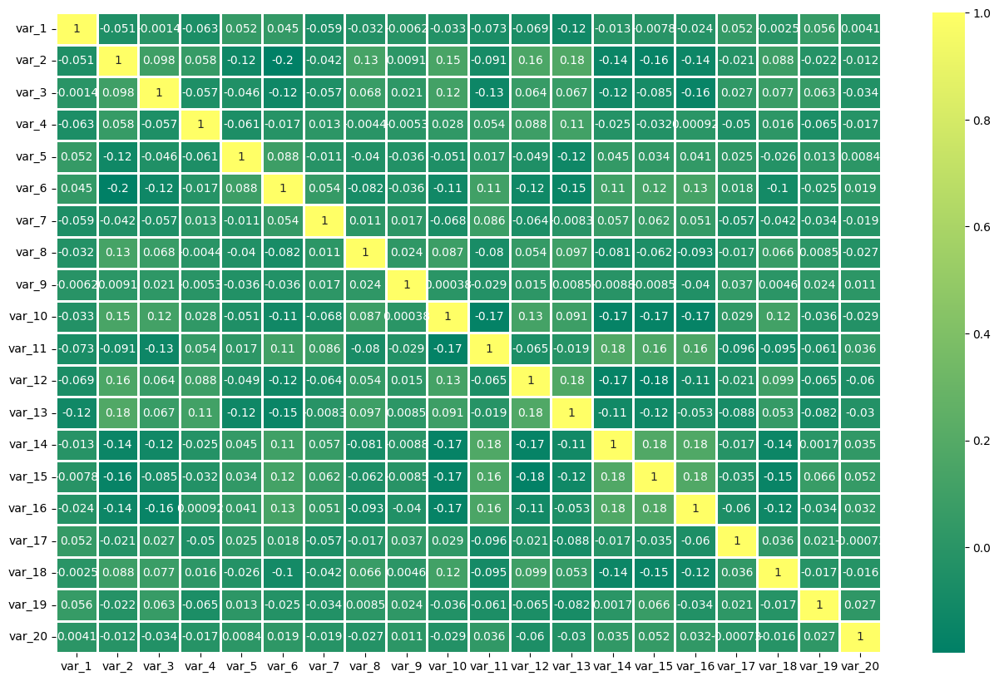

In [14]:
plt.figure(figsize=(16,10))
sns.heatmap(corr_dataset.iloc[:,:-1].corr(),cmap='summer',annot=True,linewidths=1)
plt.show()

## data standardization

In [15]:
X_values = corr_dataset.iloc[:,:-1].values

In [16]:
y_values = corr_dataset.iloc[:,-1].values

In [17]:
scaler = StandardScaler()

In [18]:
X_values = scaler.fit_transform(X_values)

In [19]:
np.mean(X_values),np.std(X_values)

(4.3183234765820086e-17, 0.9999999999999998)

In [20]:
pd.DataFrame(X_values)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,0.733526,-0.803957,0.565508,0.383981,0.562662,-0.208228,0.736306,-1.606965,-0.279104,-0.954643,1.081354,-0.942367,-1.933629,0.758956,0.563594,0.492161,-1.212596,0.288603,-0.381667,-1.678060
1,-1.125372,1.266903,2.016817,0.342128,-0.194588,-1.423921,-0.100482,-1.261976,0.396322,1.117289,-0.506154,0.181035,-0.032551,1.367679,-1.026365,-0.352203,0.189610,0.451977,0.698125,0.175245
2,-0.802316,-0.235800,-1.313309,2.042762,0.574231,-1.027324,1.207351,0.804627,-0.474156,0.146917,-0.401681,-0.217763,0.963667,1.430126,0.512013,0.407265,-0.142152,-2.194123,-2.836856,-0.361916
3,0.728644,0.500661,-0.019491,-2.267593,0.526997,-0.238813,2.023229,-1.181649,-0.659629,-2.685097,-0.491744,-2.043022,-2.084342,-0.791322,1.975516,0.976707,1.148528,-0.945816,1.562325,-0.573565
4,-0.272044,2.204457,-1.698282,0.273283,-1.853519,-0.141778,-2.137626,1.486586,1.132087,0.847295,-0.516095,0.444533,0.686878,-0.076827,0.203198,0.417458,0.973292,-0.093303,1.507691,-0.498811
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,0.369884,0.499364,-0.048136,-0.177834,1.087989,-0.370710,0.141157,-0.724577,0.393066,0.480602,0.530526,-0.809300,-1.510934,0.500347,0.030579,-1.271039,-1.747316,-0.032718,0.170117,-0.235290
4996,1.545286,-1.037572,1.273773,1.686865,0.652417,0.797363,1.222153,1.155950,-1.239195,-0.044303,0.468347,-2.171218,-1.026810,-0.232221,-1.517942,0.733742,-0.770292,0.986311,-1.290795,-1.494023
4997,1.396254,-0.792259,0.324221,1.049879,0.790008,0.262599,-0.441108,-0.651901,0.678209,-0.460417,0.135077,0.506098,-0.030787,-0.611818,-0.258214,0.754090,-0.098704,0.128303,0.092627,-1.629480
4998,-0.372237,-0.113840,0.746320,-0.340171,-0.304417,-0.843380,-0.416222,0.136392,0.074060,0.198949,-1.070981,-0.292275,0.451812,0.467880,-0.768202,0.661241,0.235532,0.815691,-1.906300,0.335150


## pca 

In [21]:
pca_general = PCA()

In [22]:
pca_general.fit(X_values)

,n_components,None
,copy,True
,whiten,False
,svd_solver,'auto'
,tol,0.0
,iterated_power,'auto'
,n_oversamples,10
,power_iteration_normalizer,'auto'
,random_state,None


In [23]:
explained_variance = pca_general.explained_variance_ratio_

In [24]:
explained_variance

array([0.12106042, 0.07393886, 0.05724679, 0.05172353, 0.05114281,
       0.04906566, 0.04765548, 0.04709073, 0.04650115, 0.04587465,
       0.04533262, 0.04367279, 0.0430149 , 0.04269307, 0.04135635,
       0.03964652, 0.0395764 , 0.03854115, 0.03817274, 0.03669339])

In [25]:
eigenvalues = pca_general.explained_variance_

In [26]:
pd.DataFrame(eigenvalues)

,0
0,2.421693
1,1.479073
2,1.145165
3,1.034678
4,1.023061
5,0.981509
6,0.953300
7,0.942003
8,0.930209
9,0.917677


In [27]:
eigenvectors = pca_general.components_

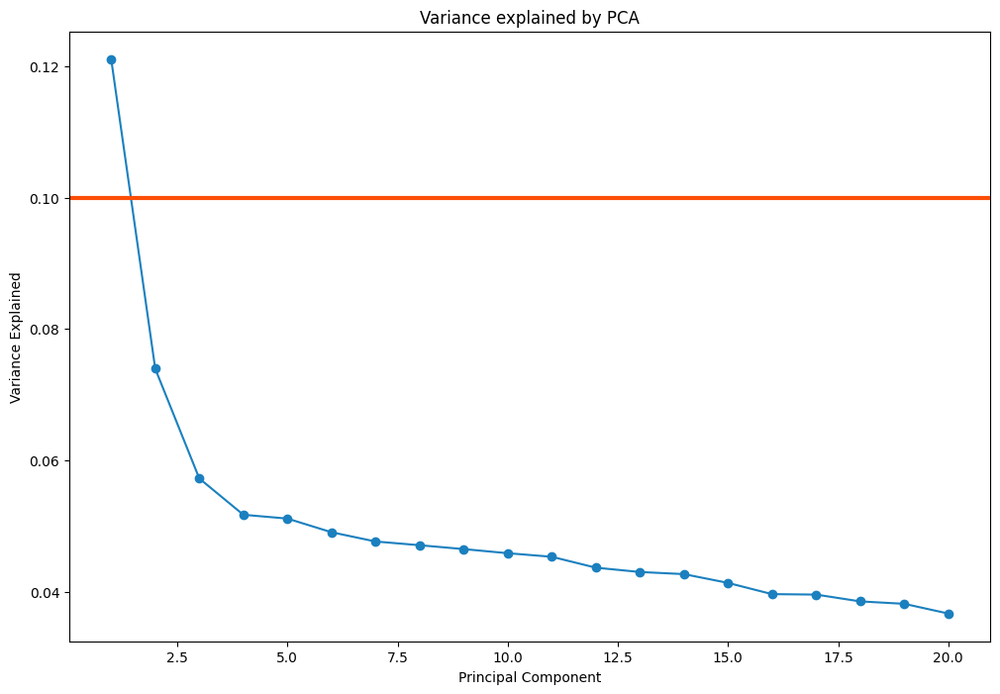

In [28]:
plt.figure(figsize=(12,8))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-', color='#1B80BF')
plt.axhline(y=0.1, color='#FC4E07', linewidth=3)
plt.title('Variance explained by PCA')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

In [29]:
pca = PCA(n_components=3)

In [30]:
X_pca = pca.fit_transform(X_values)

In [31]:
pd.DataFrame(X_pca).head(8)

,0,1,2
0,2.306485,-0.135595,-0.590882
1,-1.783400,-0.125549,1.036411
2,0.848655,2.973385,-0.842716
3,3.220120,-2.458700,1.792391
4,-1.747817,0.297113,1.271393
5,1.982409,-0.577866,0.665684
6,-0.723617,-0.528058,0.458666
7,-1.070533,-1.198976,-1.342091


In [32]:
principal_df = pd.DataFrame(data = X_pca,columns = ['dim_1','dim_2','dim_3'])

In [33]:
final_df = pd.concat([principal_df,corr_dataset[['target']]],axis = 1)

In [34]:
final_df

,dim_1,dim_2,dim_3,target
0,2.306485,-0.135595,-0.590882,1
1,-1.783400,-0.125549,1.036411,0
2,0.848655,2.973385,-0.842716,2
3,3.220120,-2.458700,1.792391,1
4,-1.747817,0.297113,1.271393,0
...,...,...,...,...
4995,0.494899,-0.588669,0.192510,1
4996,0.605030,-0.182244,-1.631511,2
4997,0.246262,-0.377192,-1.328015,0
4998,-0.991143,0.180929,-0.441201,0


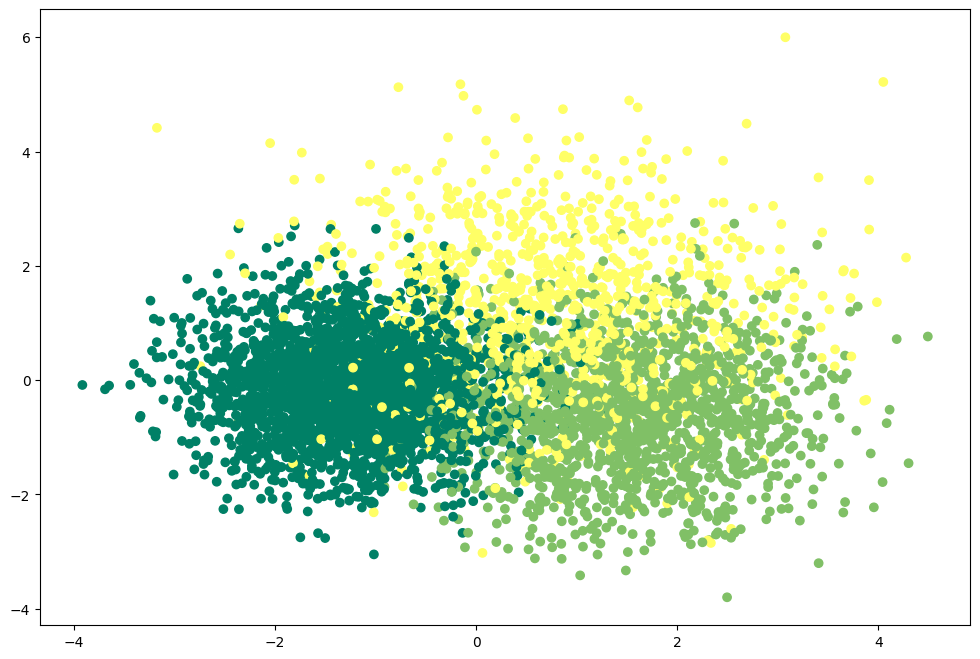

In [35]:
fig = plt.figure(figsize=(12,8))
plt.scatter(x=final_df['dim_1'],y=final_df['dim_2'],c=final_df['target'],cmap='summer')
plt.show()

## t-SNE

In [36]:
tsne = TSNE(n_components=3,random_state=42)

In [ ]:
X_tsne = tsne.fit_transform(X_values)

In [ ]:
tsne_data = pd.concat([pd.DataFrame(X_tsne,columns=('dim_1','dim_2','dim_3')),corr_dataset['target']],axis=1)

In [ ]:
tsne_data

,dim_1,dim_2,dim_3,target
0,4.778522,0.903877,-12.336326,0
1,-18.292276,-11.613237,-6.003329,1
2,6.269201,25.628448,-8.980043,0
3,-4.547427,-10.530313,-4.226581,1
4,16.023186,26.575193,0.139381,0
...,...,...,...,...
4995,-24.901993,-7.386948,-8.063716,1
4996,-9.065787,9.687778,21.146059,2
4997,12.224492,13.205192,-14.398271,0
4998,8.912273,3.173759,-0.831587,0


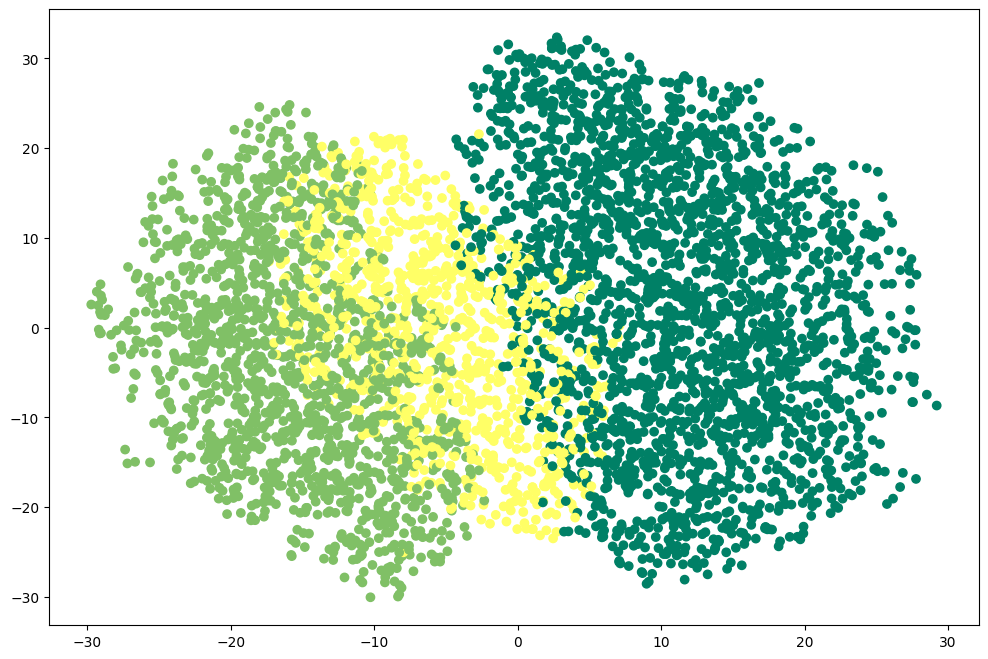

In [ ]:
fig = plt.figure(figsize=(12,8))
plt.scatter(x=tsne_data['dim_1'],y=tsne_data['dim_2'],c=tsne_data['target'],cmap='summer')
plt.show()

In [ ]:
tsne.kl_divergence_

2.0106451511383057

## umap

In [ ]:
umap = umap.UMAP(n_components=3,random_state=42)

In [ ]:
X_umap = umap.fit_transform(X_values)

In [ ]:
umap_data = pd.concat([pd.DataFrame(X_umap,columns=('dim_1','dim_2','dim_3')),corr_dataset['target']],axis=1)

In [ ]:
umap_data

,dim_1,dim_2,dim_3,target
0,12.986914,6.394261,6.130511,0
1,-1.420382,7.918985,4.996896,1
2,13.601716,8.224326,7.818289,0
3,-1.588424,8.171956,3.887403,1
4,13.956879,8.000352,7.820372,0
...,...,...,...,...
4995,-2.513602,8.335873,4.615539,1
4996,-1.065785,2.002987,5.104968,2
4997,13.486612,6.934268,6.975510,0
4998,13.129239,6.095352,6.427499,0


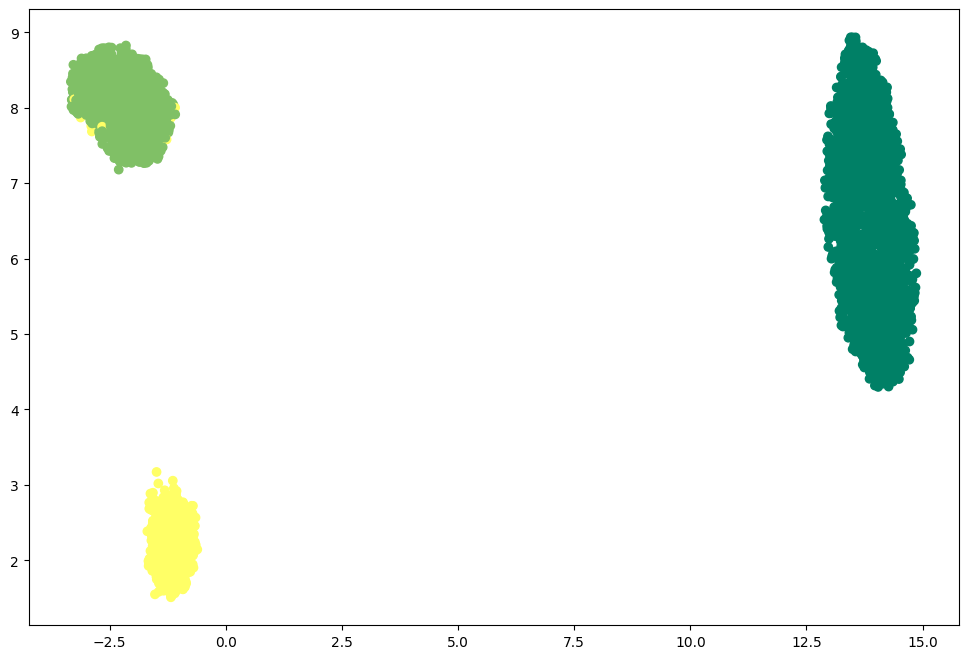

In [ ]:
fig = plt.figure(figsize=(12,8))
plt.scatter(umap_data['dim_1'],umap_data['dim_2'],c=umap_data['target'],cmap='summer')
plt.show()

## k-means 

In [ ]:
kmeans = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [ ]:
kmeans.fit(X_values)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [ ]:
df_kmeans = corr_dataset.copy()

In [ ]:
df_kmeans['k_means'] = kmeans.labels_

In [ ]:
df_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,k_means
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,1
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,2
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,1
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,2
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,2
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,0
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,1
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,1


In [ ]:
y_true = df_kmeans['target'].values  
y_kmeans = df_kmeans['k_means'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_kmeans['k_means'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_kmeans['k_means'] == y_true))

accuracy before: 0.078
accuracy after: 0.8344


In [ ]:
df_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,k_means
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,0
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,1
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,0
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,1
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,1
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,2
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,0
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,0


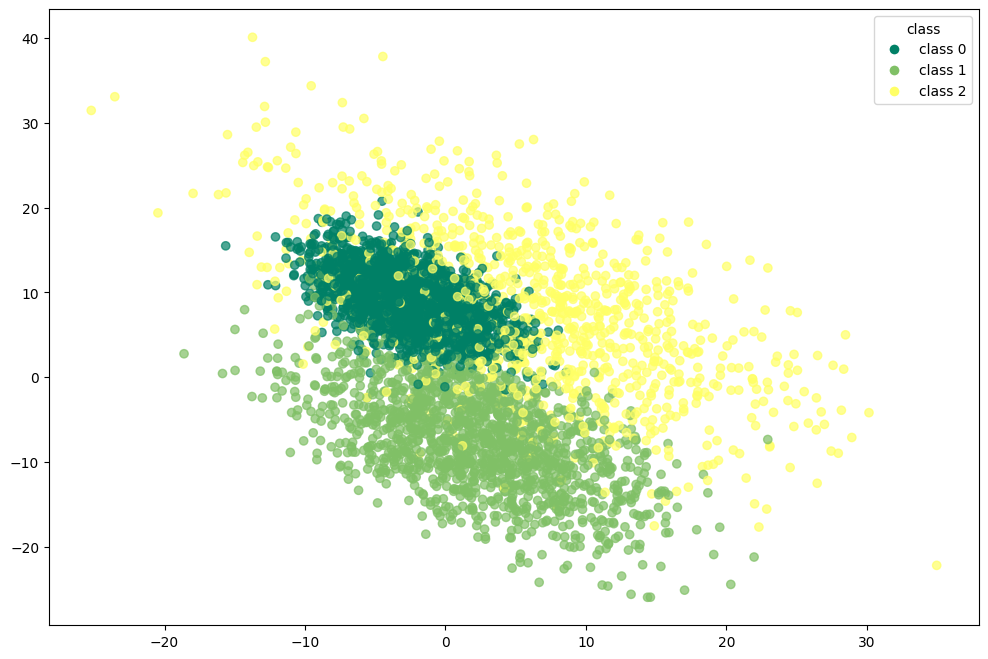

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_kmeans.iloc[:, 0],df_kmeans.iloc[:, 1], 
                      c=df_kmeans['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_kmeans['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

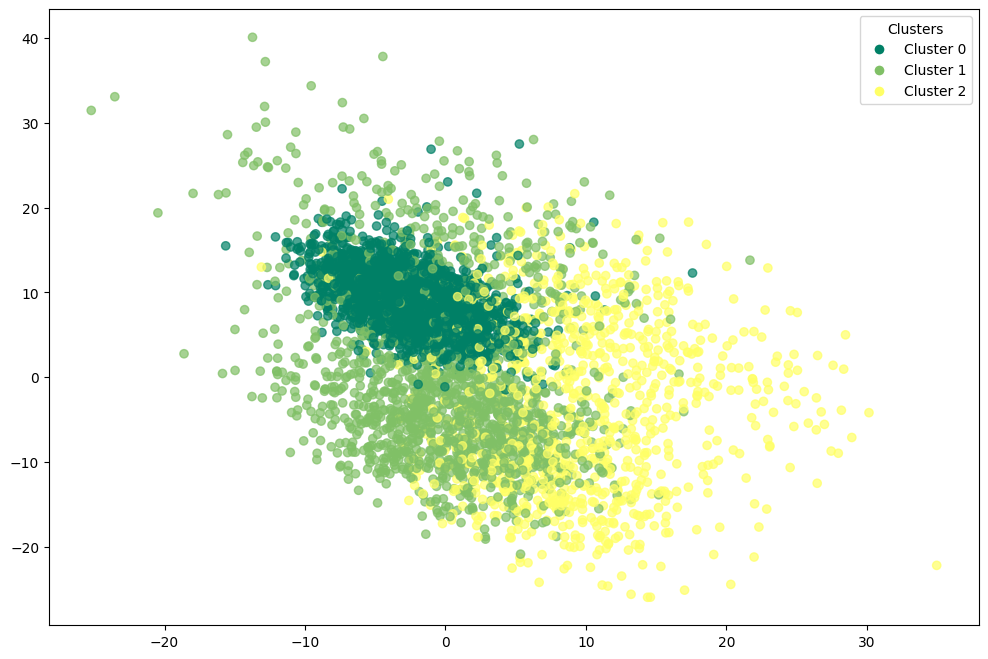

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_kmeans.iloc[:, 0], df_kmeans.iloc[:, 1], 
                      c=df_kmeans['k_means'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_kmeans['k_means'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
kmeans.cluster_centers_

array([[ 1.3343015 , -0.77905215, -0.93911922, -1.00950402,  0.93160121,
         1.13381483,  0.21230933, -0.92257648, -0.74572987,  0.02253378,
        -0.1967533 , -0.6512362 , -1.36530661, -0.08049087,  0.19481058,
        -0.01176273,  1.26450352,  0.77228901, -0.67798297,  0.58270846],
       [-0.46610423,  0.55367448,  0.6014445 ,  0.48126056, -0.33392539,
        -0.60998365, -0.45407773,  0.33333074,  0.31167709,  0.58366207,
        -0.63363485,  0.79887171,  0.77470716, -0.56750175, -0.77399433,
        -0.54594379, -0.1442739 ,  0.2494484 , -0.1802682 , -0.44821468],
       [-0.08947221, -0.42811082, -0.4034799 , -0.15175188, -0.04797607,
         0.28895202,  0.63397065,  0.04300662, -0.0373101 , -1.01078545,
         1.2115692 , -0.93121749, -0.4165073 ,  1.02164248,  1.19141511,
         0.93928855, -0.59229781, -0.93769254,  0.75712556,  0.37836552]])

In [ ]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[2500    0    0]
 [   0 1094  406]
 [  32  390  578]]


In [ ]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2500
           1       0.74      0.73      0.73      1500
           2       0.59      0.58      0.58      1000

    accuracy                           0.83      5000
   macro avg       0.77      0.77      0.77      5000
weighted avg       0.83      0.83      0.83      5000



In [ ]:
adjusted_rand_score(df_kmeans['target'],df_kmeans['k_means'])

0.7555240282829458

In [ ]:
normalized_mutual_info_score(df_kmeans['target'],df_kmeans['k_means'])

0.6726014705721622

In [ ]:
silhouette_score(df_kmeans.drop(columns=['target','k_means']).values,df_kmeans['k_means'])

0.39133687324577193

### k-means with pca

In [ ]:
kmeans_pca = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [ ]:
kmeans_pca.fit(X_pca)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [ ]:
df_pca_kmeans = corr_dataset.copy()

In [ ]:
df_pca_kmeans["kmeans_pca"] = kmeans_pca.labels_

In [ ]:
df_pca_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,kmeans_pca
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,1
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,2
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,1
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,2
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,2
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,0
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,1
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,1


In [ ]:
y_true = df_pca_kmeans['target'].values  
y_kmeans = df_pca_kmeans['kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_kmeans['kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_kmeans['kmeans_pca'] == y_true))

accuracy before: 0.0036
accuracy after: 0.9934


In [ ]:
df_pca_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,kmeans_pca
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,0
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,1
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,0
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,1
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,1
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,2
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,0
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,0


In [ ]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[2500    0    0]
 [   0 1497    3]
 [  12   18  970]]


In [ ]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2500
           1       0.99      1.00      0.99      1500
           2       1.00      0.97      0.98      1000

    accuracy                           0.99      5000
   macro avg       0.99      0.99      0.99      5000
weighted avg       0.99      0.99      0.99      5000



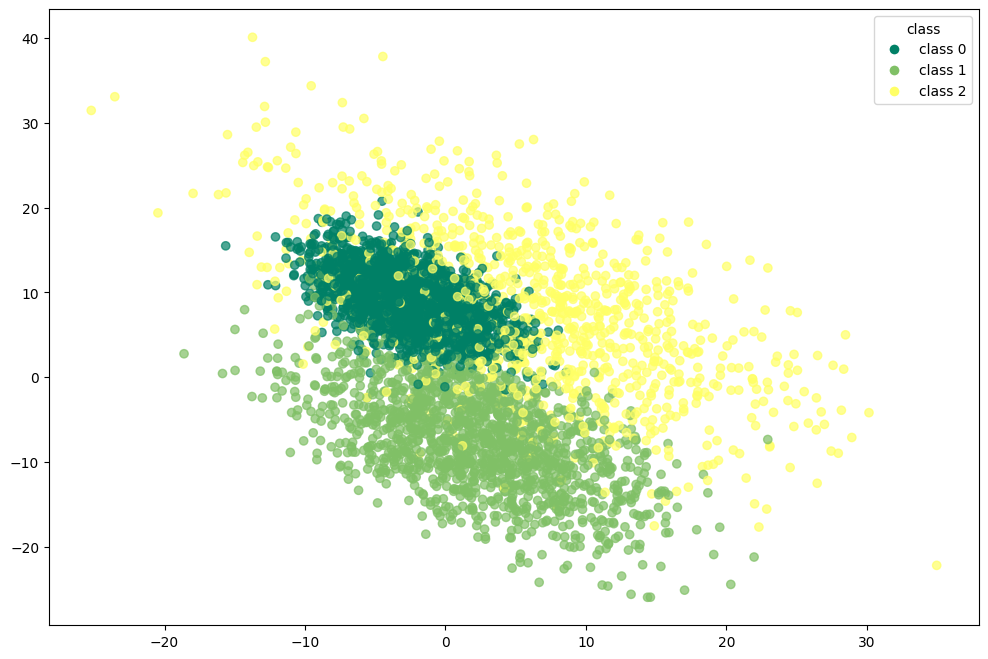

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

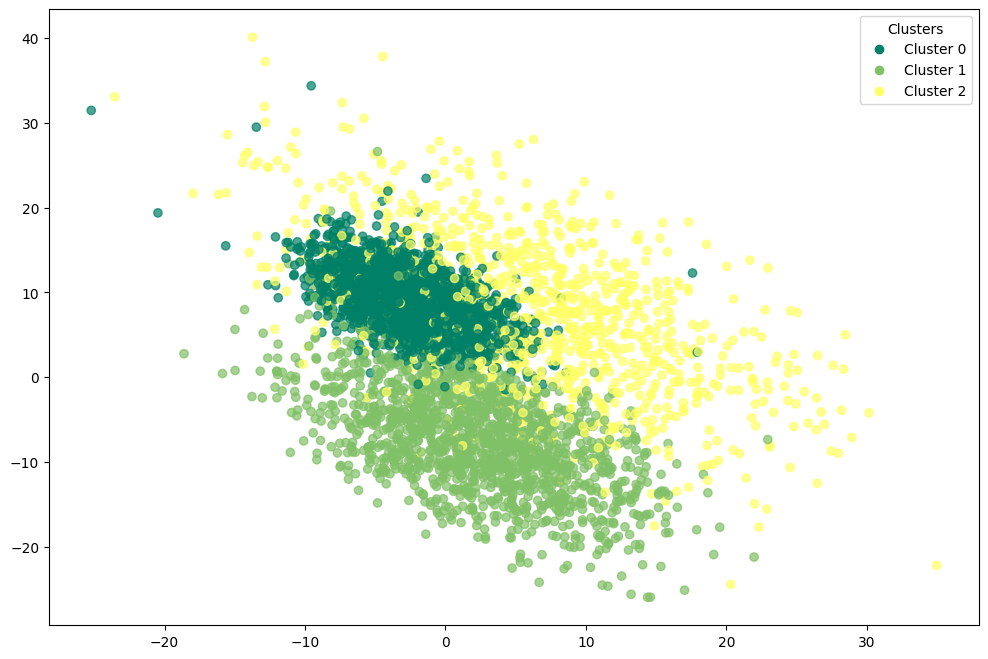

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
adjusted_rand_score(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca'])

0.9841096600888305

In [ ]:
normalized_mutual_info_score(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca'])

0.963936555117787

In [ ]:
silhouette_score(df_pca_kmeans.drop(columns=['target','kmeans_pca']).values,df_pca_kmeans['kmeans_pca'])

0.42148998889655886

### k-means with t-SNE

In [ ]:
kmeans_tsne = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [ ]:
kmeans_tsne.fit(X_tsne)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [ ]:
df_tsne_kmeans = corr_dataset.copy()

In [ ]:
df_tsne_kmeans['kmeans_tsne'] = kmeans_tsne.labels_

In [ ]:
df_tsne_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,kmeans_tsne
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,1
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,2
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,0
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,2
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,2
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,0
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,0
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,1


In [ ]:
y_true = df_tsne_kmeans['target'].values  
y_kmeans = df_tsne_kmeans['kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_kmeans['kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_kmeans['kmeans_tsne'] == y_true))

accuracy before: 0.3594
accuracy after: 0.6028


In [ ]:
df_tsne_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,kmeans_tsne
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,0
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,1
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,2
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,1
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,1
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,2
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,2
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,0


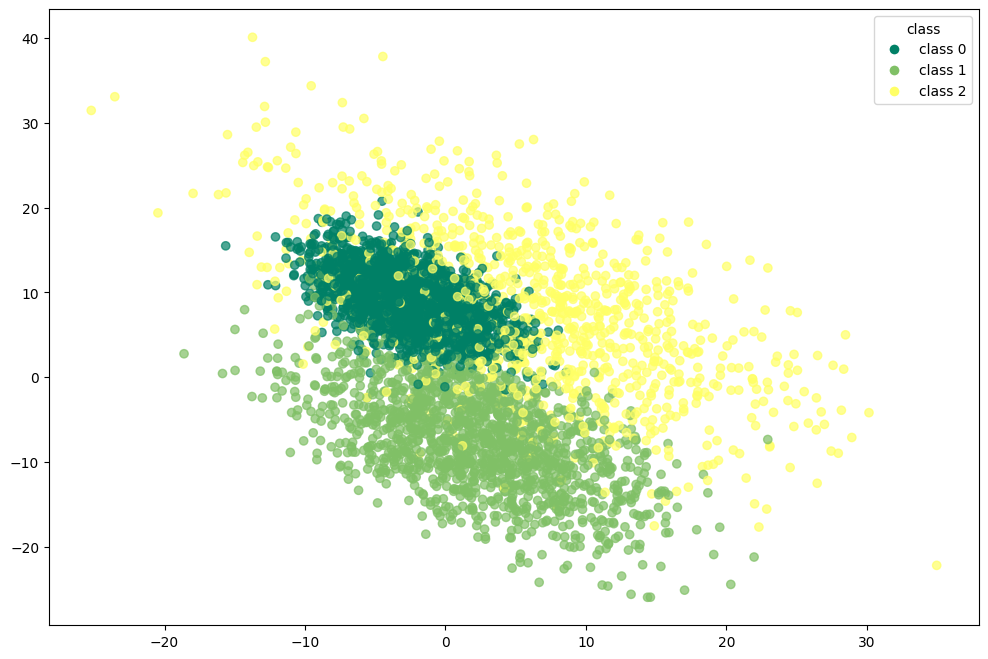

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

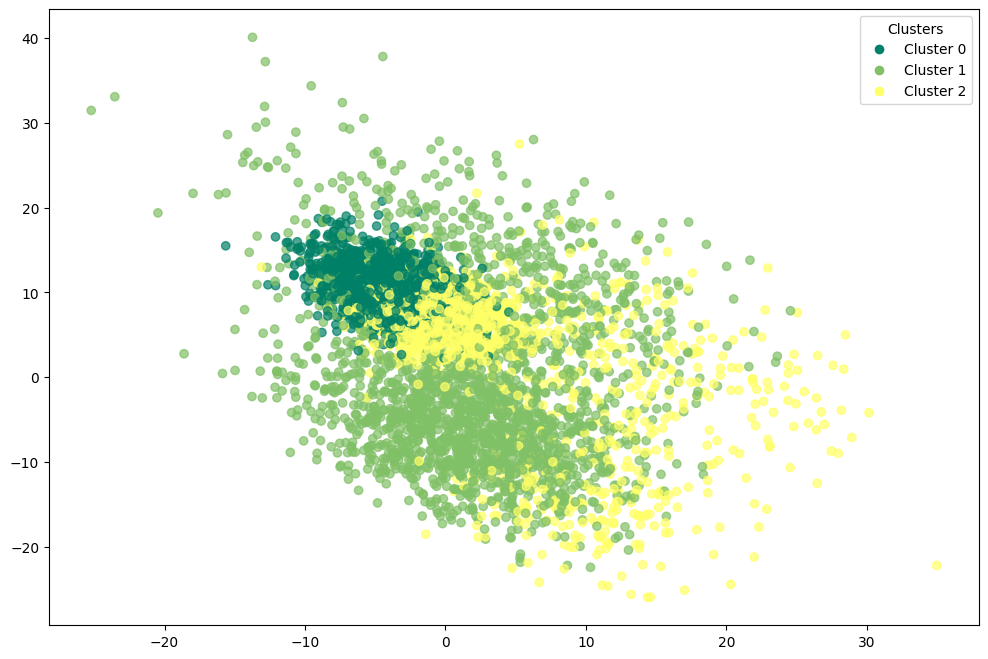

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_kmeans['kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne']))

[[1405    5 1090]
 [   0 1316  184]
 [   0  707  293]]


In [ ]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      0.56      0.72      2500
           1       0.65      0.88      0.75      1500
           2       0.19      0.29      0.23      1000

    accuracy                           0.60      5000
   macro avg       0.61      0.58      0.56      5000
weighted avg       0.73      0.60      0.63      5000



In [ ]:
adjusted_rand_score(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])

0.3924185034343522

In [ ]:
normalized_mutual_info_score(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])

0.4769478055924245

In [ ]:
silhouette_score(df_tsne_kmeans.drop(columns=['target','kmeans_tsne']).values,df_tsne_kmeans['kmeans_tsne'])

0.133063787241664

### k-means with umap

In [ ]:
kmeans_umap = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [ ]:
kmeans_umap.fit(X_umap)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [ ]:
df_umap_kmeans = corr_dataset.copy()

In [ ]:
df_umap_kmeans['kmeans_umap'] = kmeans_umap.labels_

In [ ]:
df_umap_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,kmeans_umap
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,1
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,2
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,1
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,2
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,2
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,0
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,1
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,1


In [ ]:
y_true = df_umap_kmeans['target'].values  
y_kmeans = df_umap_kmeans['kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_kmeans['kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_kmeans['kmeans_umap'] == y_true))

accuracy before: 0.0036
accuracy after: 0.996


In [ ]:
df_umap_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,kmeans_umap
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,0
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,1
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,0
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,1
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,1
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,2
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,0
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,0


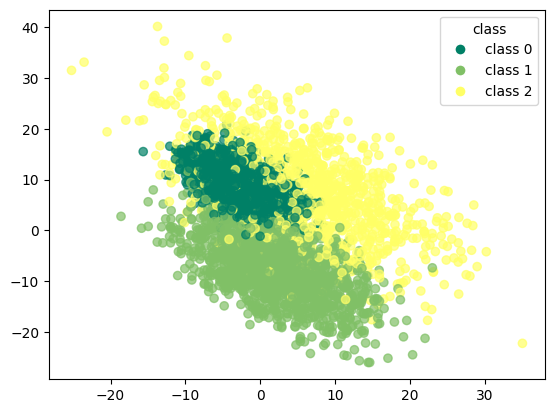

In [ ]:
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

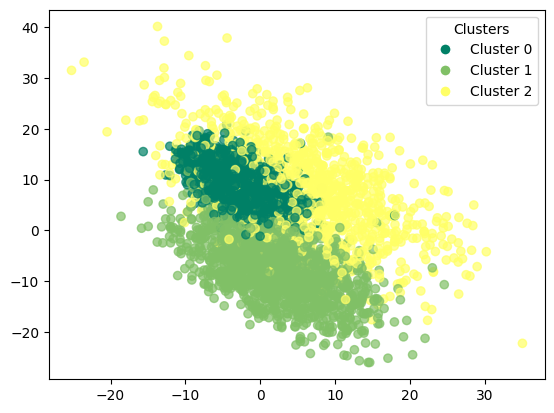

In [ ]:
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_kmeans['kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap']))

[[2500    0    0]
 [   0 1500    0]
 [   2   18  980]]


In [ ]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2500
           1       0.99      1.00      0.99      1500
           2       1.00      0.98      0.99      1000

    accuracy                           1.00      5000
   macro avg       1.00      0.99      0.99      5000
weighted avg       1.00      1.00      1.00      5000



In [ ]:
adjusted_rand_score(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])

0.9912348363774522

In [ ]:
normalized_mutual_info_score(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])

0.9787576246196595

In [ ]:
silhouette_score(df_umap_kmeans.drop(columns=['target','kmeans_umap']).values,df_umap_kmeans['kmeans_umap'])

0.4219941435654309

## Birch

In [ ]:
birch = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [ ]:
birch.fit(X_values)

,threshold,1.5
,branching_factor,50
,n_clusters,3
,compute_labels,True
,copy,'deprecated'


In [ ]:
df_birch = corr_dataset.copy()

In [ ]:
df_birch['birch'] = birch.labels_

In [ ]:
df_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,birch
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,1
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,0
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,1
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,0
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,0
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,1
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,1
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,1


In [ ]:
y_true = df_birch['target'].values  
y_kmeans = df_birch['birch'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_birch['birch'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_birch['birch'] == y_true))

accuracy before: 0.0576
accuracy after: 0.8566


In [ ]:
df_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,birch
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,0
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,1
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,0
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,1
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,1
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,0
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,0
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,0


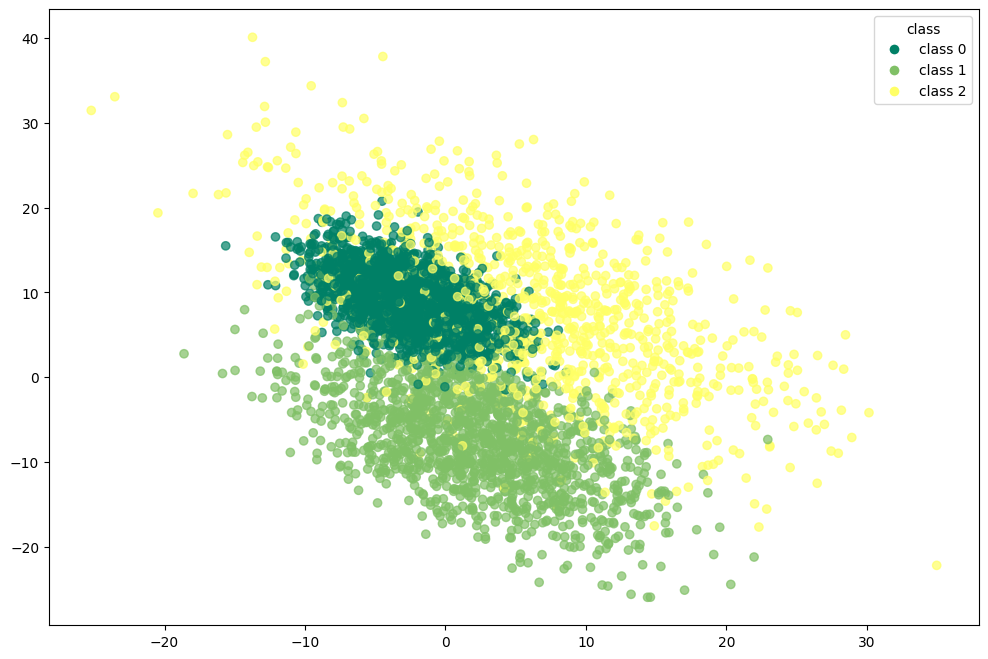

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_birch.iloc[:, 0], df_birch.iloc[:, 1], 
                      c=df_birch['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_birch['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

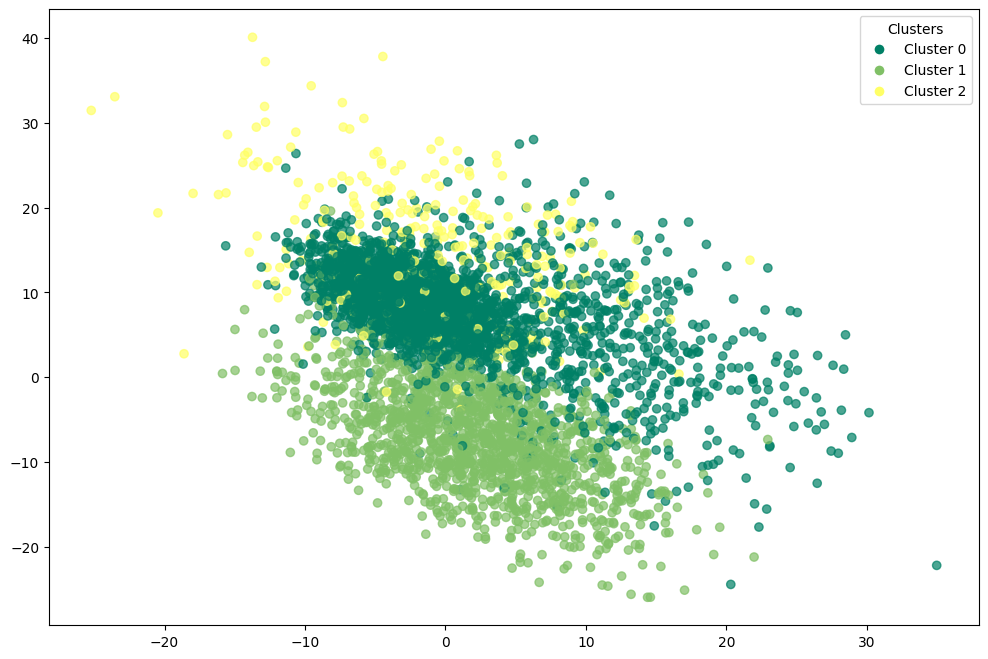

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_birch.iloc[:, 0], df_birch.iloc[:, 1], 
                      c=df_birch['birch'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_birch['birch'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_birch['target'],df_birch['birch']))

[[2500    0    0]
 [   2 1497    1]
 [ 707    7  286]]


In [ ]:
print(classification_report(df_birch['target'],df_birch['birch']))

              precision    recall  f1-score   support

           0       0.78      1.00      0.88      2500
           1       1.00      1.00      1.00      1500
           2       1.00      0.29      0.44      1000

    accuracy                           0.86      5000
   macro avg       0.92      0.76      0.77      5000
weighted avg       0.89      0.86      0.83      5000



In [ ]:
adjusted_rand_score(df_birch['target'],df_birch['birch'])

0.6810597489980201

In [ ]:
normalized_mutual_info_score(df_birch['target'],df_birch['birch'])

0.736793968390849

In [ ]:
silhouette_score(df_birch.drop(columns=['target','birch']).values,df_birch['birch'])

0.3570923029962109

### Birch with pca

In [ ]:
birch_pca = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [ ]:
birch_pca.fit(X_pca)

,threshold,1.5
,branching_factor,50
,n_clusters,3
,compute_labels,True
,copy,'deprecated'


In [ ]:
df_pca_birch = corr_dataset.copy()

In [ ]:
df_pca_birch["birch_pca"] = birch_pca.labels_

In [ ]:
df_pca_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,birch_pca
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,0
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,0
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,0
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,0
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,0
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,0
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,0
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,0


In [ ]:
y_true = df_pca_birch['target'].values  
y_kmeans = df_pca_birch['birch_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_birch['birch_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_birch['birch_pca'] == y_true))

accuracy before: 0.5228
accuracy after: 0.5794


In [ ]:
df_pca_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,birch_pca
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,0
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,0
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,0
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,0
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,0
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,0
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,0
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,0


In [ ]:
print(confusion_matrix(df_pca_birch['target'],df_pca_birch['birch_pca']))

[[2500    0    0]
 [1204  296    0]
 [ 785  114  101]]


In [ ]:
print(classification_report(df_pca_birch['target'],df_pca_birch['birch_pca']))

              precision    recall  f1-score   support

           0       0.56      1.00      0.72      2500
           1       0.72      0.20      0.31      1500
           2       1.00      0.10      0.18      1000

    accuracy                           0.58      5000
   macro avg       0.76      0.43      0.40      5000
weighted avg       0.70      0.58      0.49      5000



In [ ]:
adjusted_rand_score(df_pca_birch['target'],df_pca_birch['birch_pca'])

0.09749605139327036

In [ ]:
normalized_mutual_info_score(df_pca_birch['target'],df_pca_birch['birch_pca'])

0.1387795365233183

In [ ]:
silhouette_score(df_pca_birch.drop(columns=['target','birch_pca']).values,df_pca_birch['birch_pca'])

0.23928112281850752

### Birch with t-SNE

In [ ]:
birch_tsne = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [ ]:
birch_tsne.fit(X_tsne)

,threshold,1.5
,branching_factor,50
,n_clusters,3
,compute_labels,True
,copy,'deprecated'


In [ ]:
df_tsne_birch = corr_dataset.copy()

In [ ]:
df_tsne_birch['birch_tsne'] = birch_tsne.labels_

In [ ]:
df_tsne_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,birch_tsne
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,1
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,0
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,2
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,0
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,0
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,0
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,2
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,1


In [ ]:
y_true = df_tsne_birch['target'].values  
y_kmeans = df_tsne_birch['birch_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_birch['birch_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_birch['birch_tsne'] == y_true))

accuracy before: 0.0004
accuracy after: 0.5776


In [ ]:
df_tsne_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,birch_tsne
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,0
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,1
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,2
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,1
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,1
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,1
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,2
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,0


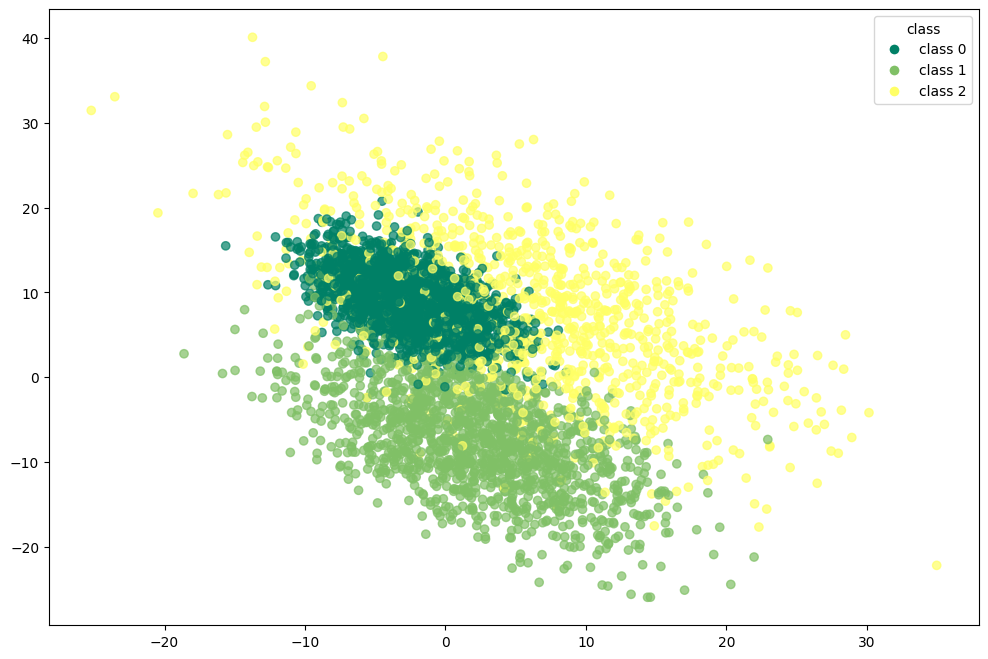

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_birch.iloc[:, 0], df_tsne_birch.iloc[:, 1], 
                      c=df_tsne_birch['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_birch['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

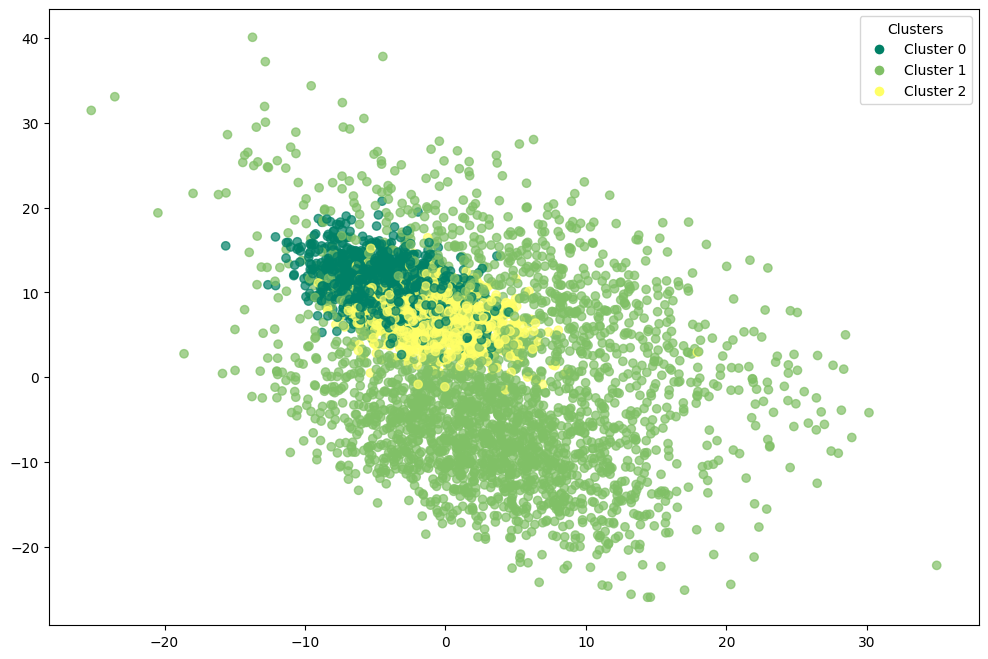

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_birch.iloc[:, 0], df_tsne_birch.iloc[:, 1], 
                      c=df_tsne_birch['birch_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_birch['birch_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_tsne_birch['target'],df_tsne_birch['birch_tsne']))

[[1387    1 1112]
 [   0 1500    0]
 [   1  998    1]]


In [ ]:
print(classification_report(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      0.55      0.71      2500
           1       0.60      1.00      0.75      1500
           2       0.00      0.00      0.00      1000

    accuracy                           0.58      5000
   macro avg       0.53      0.52      0.49      5000
weighted avg       0.68      0.58      0.58      5000



In [ ]:
adjusted_rand_score(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])

0.48125247381217534

In [ ]:
normalized_mutual_info_score(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])

0.6663490733071722

In [ ]:
silhouette_score(df_tsne_birch.drop(columns=['target','birch_tsne']).values,df_tsne_birch['birch_tsne'])

0.11754683233072033

### Birch with umap

In [ ]:
birch_umap = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [ ]:
birch_umap.fit(X_umap)

,threshold,1.5
,branching_factor,50
,n_clusters,3
,compute_labels,True
,copy,'deprecated'


In [ ]:
df_umap_birch = corr_dataset.copy()

In [ ]:
df_umap_birch['birch_umap'] = birch_umap.labels_

In [ ]:
df_umap_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,birch_umap
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,0
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,2
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,0
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,2
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,2
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,1
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,0
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,0


In [ ]:
y_true = df_umap_birch['target'].values  
y_kmeans = df_umap_birch['birch_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_birch['birch_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_birch['birch_umap'] == y_true))

accuracy before: 0.5036
accuracy after: 0.996


In [ ]:
df_umap_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,birch_umap
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,0
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,1
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,0
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,1
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,1
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,2
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,0
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,0


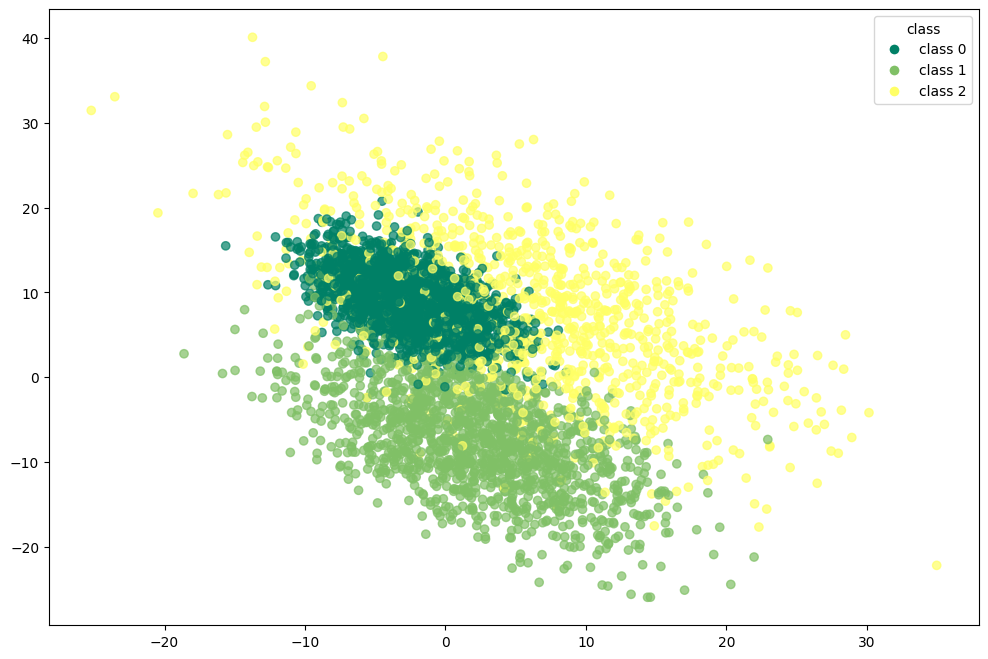

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_birch.iloc[:, 0], df_umap_birch.iloc[:, 1], 
                      c=df_umap_birch['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_birch['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

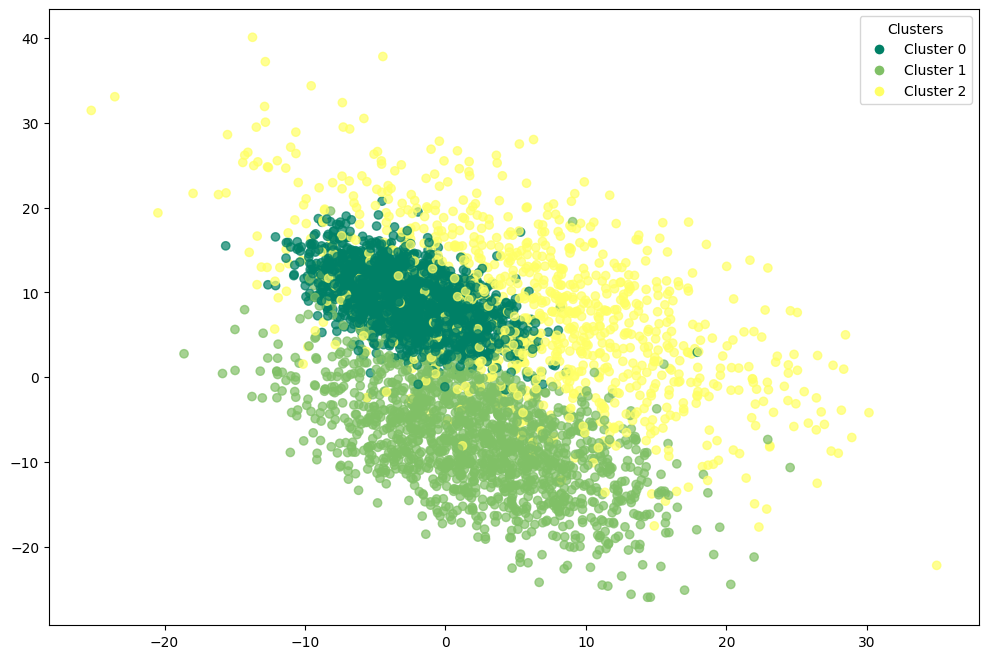

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_birch.iloc[:, 0], df_umap_birch.iloc[:, 1], 
                      c=df_umap_birch['birch_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_birch['birch_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_umap_birch['target'],df_umap_birch['birch_umap']))

[[2500    0    0]
 [   0 1500    0]
 [   2   18  980]]


In [ ]:
print(classification_report(df_umap_birch['target'],df_umap_birch['birch_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2500
           1       0.99      1.00      0.99      1500
           2       1.00      0.98      0.99      1000

    accuracy                           1.00      5000
   macro avg       1.00      0.99      0.99      5000
weighted avg       1.00      1.00      1.00      5000



In [ ]:
adjusted_rand_score(df_umap_birch['target'],df_umap_birch['birch_umap'])

0.9912348363774522

In [ ]:
normalized_mutual_info_score(df_umap_birch['target'],df_umap_birch['birch_umap'])

0.9787576246196595

In [ ]:
silhouette_score(df_umap_birch.drop(columns=['target','birch_umap']).values,df_umap_birch['birch_umap'])

0.4219941435654309

## GMM - Gaussian Mixture Models

In [ ]:
gmm = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [ ]:
gmm.fit(X_values)

,n_components,3
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [ ]:
df_gmm = corr_dataset.copy()

In [ ]:
df_gmm['gmm'] = gmm.predict(X_values)

In [ ]:
df_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,gmm
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,1
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,2
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,1
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,2
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,2
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,0
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,1
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,1


In [ ]:
y_true = df_gmm['target'].values  
y_kmeans = df_gmm['gmm'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_gmm['gmm'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_gmm['gmm'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


In [ ]:
df_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,gmm
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,0
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,1
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,0
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,1
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,1
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,2
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,0
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,0


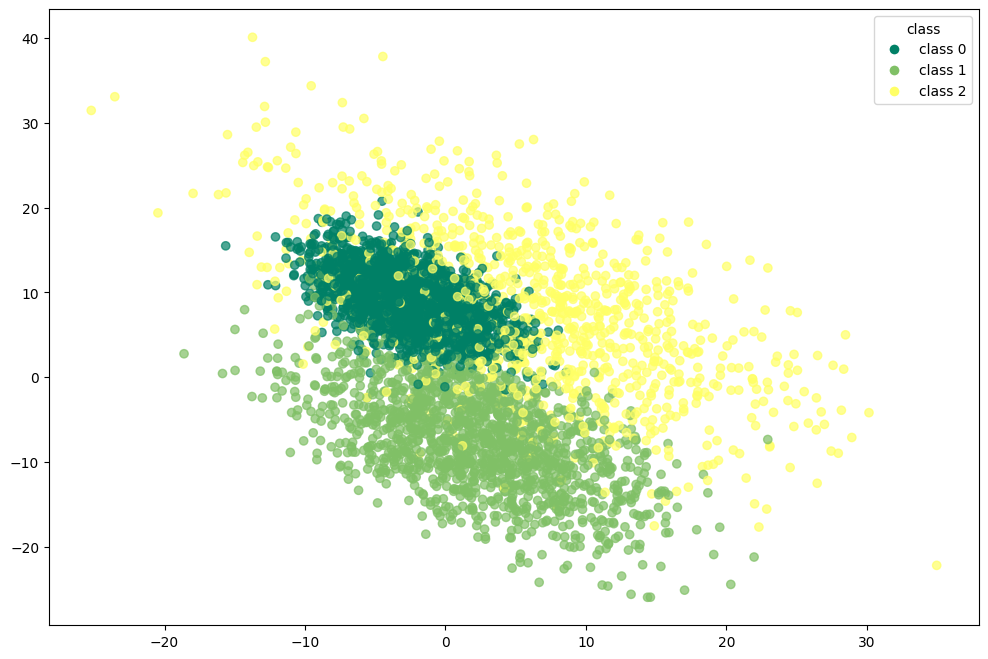

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

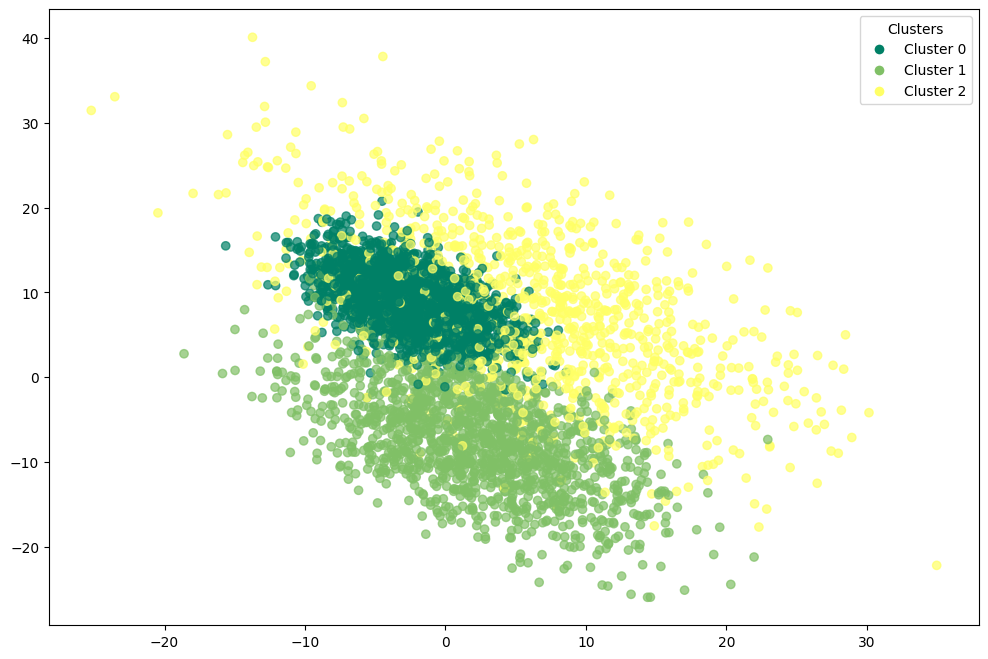

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['gmm'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_gmm['gmm'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[2500    0    0]
 [   0 1500    0]
 [   0    0 1000]]


In [ ]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2500
           1       1.00      1.00      1.00      1500
           2       1.00      1.00      1.00      1000

    accuracy                           1.00      5000
   macro avg       1.00      1.00      1.00      5000
weighted avg       1.00      1.00      1.00      5000



In [ ]:
adjusted_rand_score(df_gmm['target'],df_gmm['gmm'])

1.0

In [ ]:
normalized_mutual_info_score(df_gmm['target'],df_gmm['gmm'])

1.0

In [ ]:
silhouette_score(df_gmm.drop(columns=['target','gmm']).values,df_gmm['gmm'])

0.4215159287543271

### GMM with pca

In [ ]:
gmm_pca = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [ ]:
gmm_pca.fit(X_pca)

,n_components,3
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [ ]:
df_pca_gmm = corr_dataset.copy()

In [ ]:
df_pca_gmm['gmm_pca'] = gmm_pca.predict(X_pca)

In [ ]:
df_pca_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,gmm_pca
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,1
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,2
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,1
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,2
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,2
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,0
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,1
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,1


In [ ]:
y_true = df_pca_gmm['target'].values  
y_kmeans = df_pca_gmm['gmm_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_gmm['gmm_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_gmm['gmm_pca'] == y_true))

accuracy before: 0.0014
accuracy after: 0.998


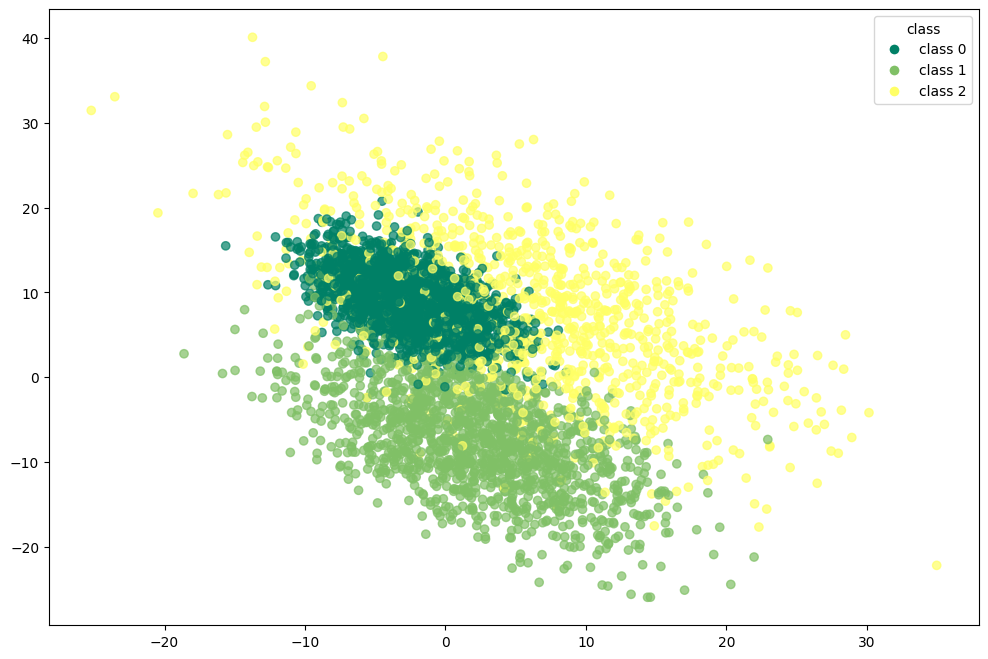

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

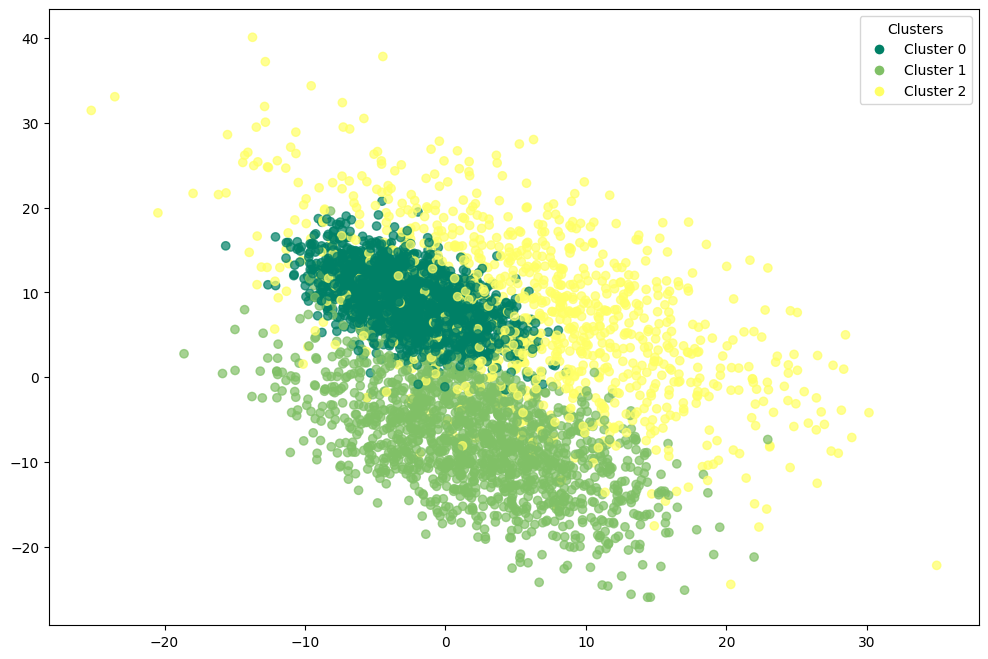

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['gmm_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_gmm['gmm_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[2500    0    0]
 [   0 1497    3]
 [   0    7  993]]


In [ ]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2500
           1       1.00      1.00      1.00      1500
           2       1.00      0.99      0.99      1000

    accuracy                           1.00      5000
   macro avg       1.00      1.00      1.00      5000
weighted avg       1.00      1.00      1.00      5000



In [ ]:
adjusted_rand_score(df_pca_gmm['target'],df_pca_gmm['gmm_pca'])

0.9957714633576441

In [ ]:
normalized_mutual_info_score(df_pca_gmm['target'],df_pca_gmm['gmm_pca'])

0.9875342524497728

In [ ]:
silhouette_score(df_pca_gmm.drop(columns=['target','gmm_pca']).values,df_pca_gmm['gmm_pca'])

0.42171208632139867

### GMM with t-SNE

In [ ]:
gmm_tsne = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [ ]:
gmm_tsne.fit(X_tsne)

,n_components,3
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [ ]:
df_tsne_gmm = corr_dataset.copy()

In [ ]:
df_tsne_gmm['gmm_tsne'] = gmm_tsne.predict(X_tsne)

In [ ]:
df_tsne_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,gmm_tsne
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,1
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,2
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,1
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,2
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,2
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,0
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,1
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,1


In [ ]:
y_true = df_tsne_gmm['target'].values  
y_kmeans = df_tsne_gmm['gmm_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_gmm['gmm_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_gmm['gmm_tsne'] == y_true))

accuracy before: 0.0052
accuracy after: 0.9946


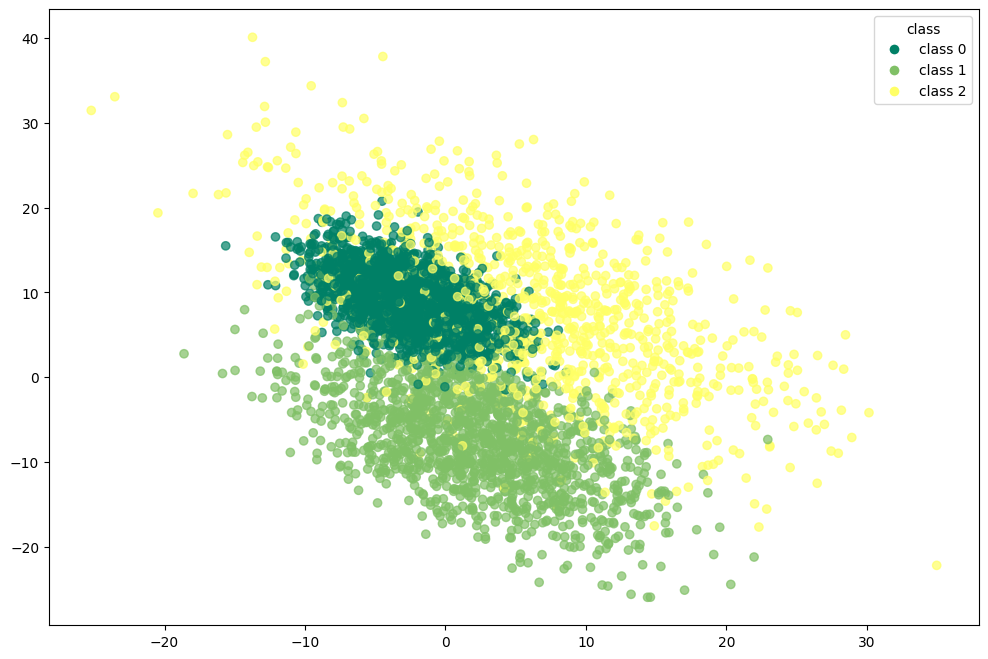

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

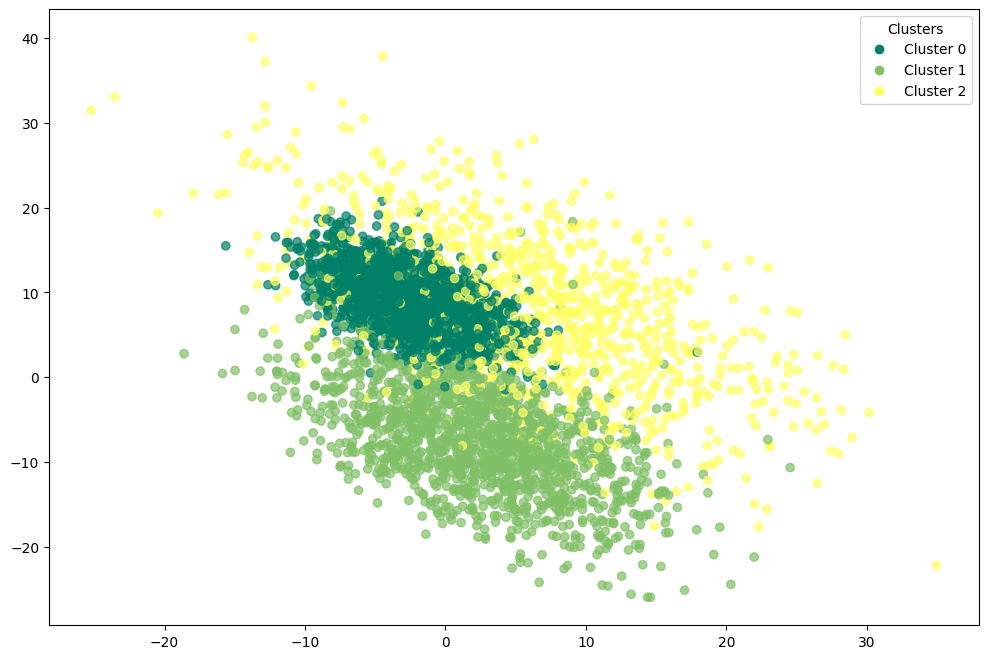

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['gmm_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_gmm['gmm_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[2500    0    0]
 [   0 1500    0]
 [   1   26  973]]


In [ ]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2500
           1       0.98      1.00      0.99      1500
           2       1.00      0.97      0.99      1000

    accuracy                           0.99      5000
   macro avg       0.99      0.99      0.99      5000
weighted avg       0.99      0.99      0.99      5000



In [ ]:
adjusted_rand_score(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne'])

0.9884928537504107

In [ ]:
normalized_mutual_info_score(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne'])

0.9738525843025411

In [ ]:
silhouette_score(df_tsne_gmm.drop(columns=['target','gmm_tsne']).values,df_tsne_gmm['gmm_tsne'])

0.42170248234460866

### GMM with umap

In [ ]:
gmm_umap = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [ ]:
gmm_umap.fit(X_umap)

,n_components,3
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [ ]:
df_umap_gmm = corr_dataset.copy()

In [ ]:
df_umap_gmm['gmm_umap'] = gmm_umap.predict(X_umap)

In [ ]:
df_umap_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,gmm_umap
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,1
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,2
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,1
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,2
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,2
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,0
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,1
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,1


In [ ]:
y_true = df_umap_gmm['target'].values  
y_kmeans = df_umap_gmm['gmm_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_gmm['gmm_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_gmm['gmm_umap'] == y_true))

accuracy before: 0.0036
accuracy after: 0.996


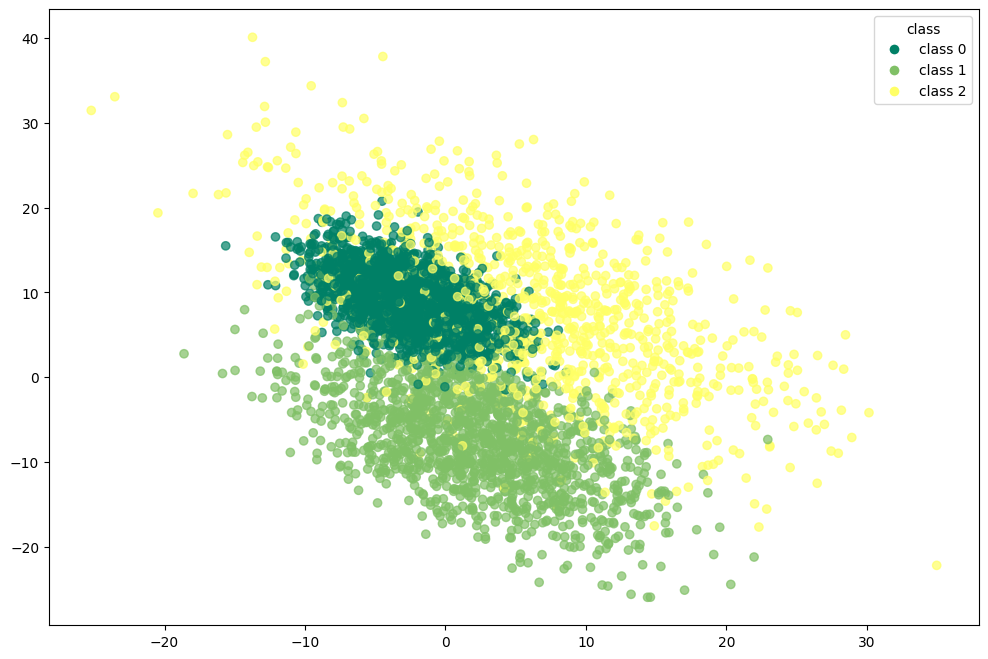

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

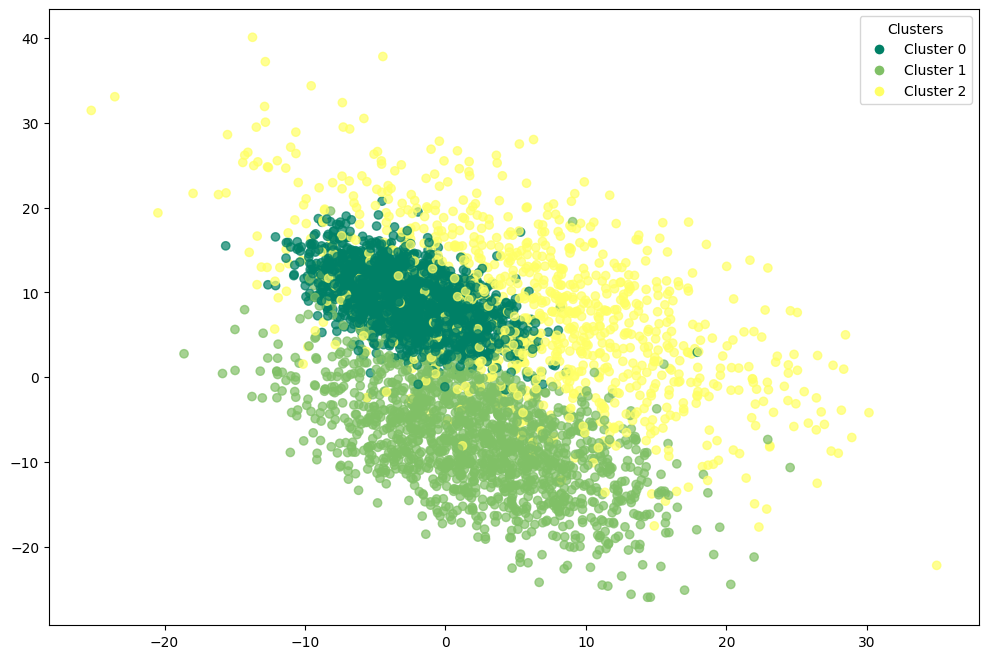

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['gmm_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_gmm['gmm_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[2500    0    0]
 [   0 1500    0]
 [   2   18  980]]


In [ ]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2500
           1       0.99      1.00      0.99      1500
           2       1.00      0.98      0.99      1000

    accuracy                           1.00      5000
   macro avg       1.00      0.99      0.99      5000
weighted avg       1.00      1.00      1.00      5000



In [ ]:
adjusted_rand_score(df_umap_gmm['target'],df_umap_gmm['gmm_umap'])

0.9912348363774522

In [ ]:
normalized_mutual_info_score(df_umap_gmm['target'],df_umap_gmm['gmm_umap'])

0.9787576246196595

In [ ]:
silhouette_score(df_umap_gmm.drop(columns=['target','gmm_umap']).values,df_umap_gmm['gmm_umap'])

0.4219941435654309

## pam

In [ ]:
initial_medoids = np.random.choice(len(X_values),N_CLUSTER,replace=False)

In [ ]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [ ]:
pam = kmedoids(X_values,initial_medoids,metric=metric)

In [ ]:
pam.process()

In [ ]:
clusters = pam.get_clusters()

In [ ]:
medoids = pam.get_medoids()

In [ ]:
labels = np.zeros(len(X_values))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [ ]:
df_pam = corr_dataset.copy()

In [ ]:
df_pam['pam'] = labels

In [ ]:
df_pam

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,pam
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,0.0
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,2.0
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,0.0
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,2.0
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,2.0
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,0.0
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,0.0
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,0.0


In [ ]:
y_true = df_pam['target'].values  
y_kmeans = df_pam['pam'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam['pam'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam['pam'] == y_true))

accuracy before: 0.711
accuracy after: 0.7424


In [ ]:
df_pam

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,pam
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,0
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,1
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,0
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,1
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,1
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,0
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,0
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,0


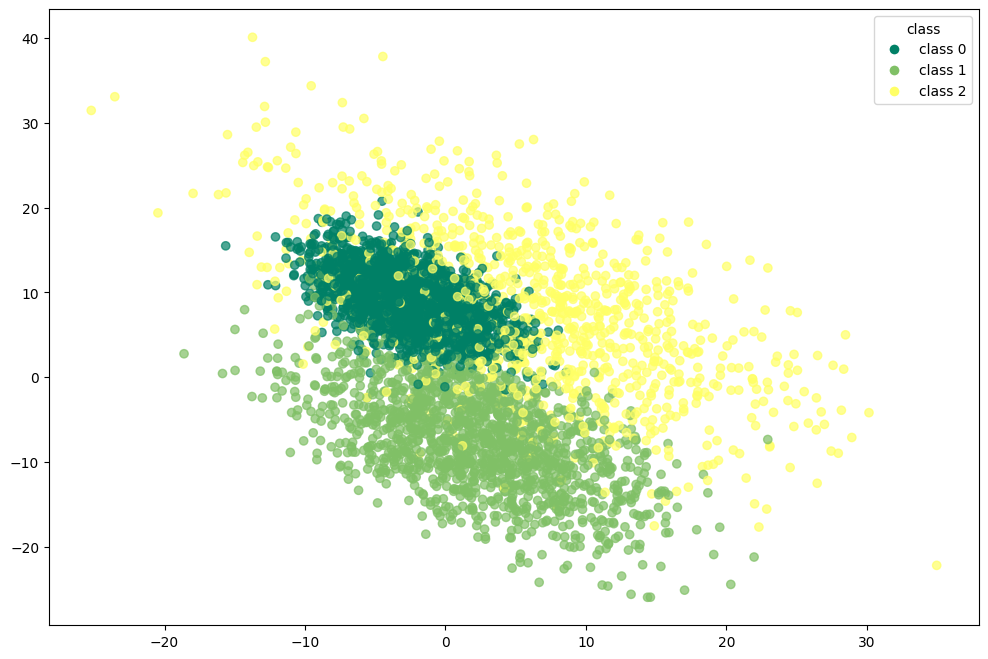

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

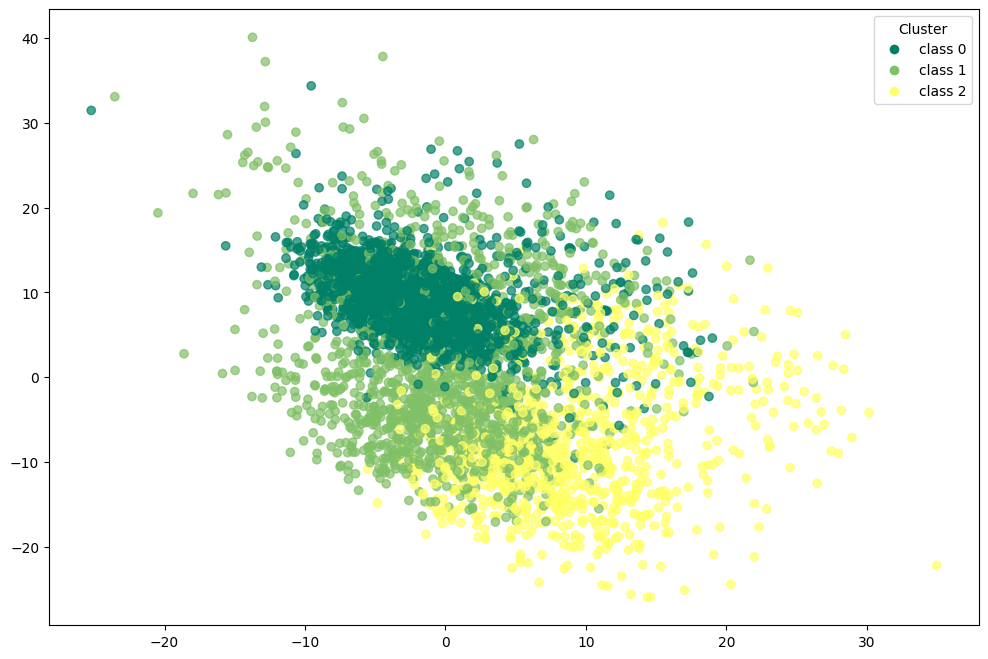

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['pam'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['pam'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [ ]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[2500    0    0]
 [   0  900  600]
 [ 233  455  312]]


In [ ]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       0.91      1.00      0.96      2500
           1       0.66      0.60      0.63      1500
           2       0.34      0.31      0.33      1000

    accuracy                           0.74      5000
   macro avg       0.64      0.64      0.64      5000
weighted avg       0.73      0.74      0.73      5000



In [ ]:
adjusted_rand_score(df_pam['target'],df_pam['pam'])

0.6580039276019903

In [ ]:
normalized_mutual_info_score(df_pam['target'],df_pam['pam'])

0.573348925471948

In [ ]:
silhouette_score(df_pam.drop(columns=['target','pam']).values,df_pam['pam'])

0.36689782756210243

### pam with pca

In [ ]:
initial_medoids = np.random.choice(len(X_pca),N_CLUSTER,replace=False)

In [ ]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [ ]:
pam_pca = kmedoids(X_pca,initial_medoids,metric=metric)

In [ ]:
pam_pca.process()

In [ ]:
clusters = pam_pca.get_clusters()

In [ ]:
medoids = pam_pca.get_medoids()

In [ ]:
labels = np.zeros(len(X_pca))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [ ]:
df_pam_pca = corr_dataset.copy()

In [ ]:
df_pam_pca['pam_pca'] = labels

In [ ]:
df_pam_pca

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,pam_pca
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,2.0
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,1.0
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,2.0
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,1.0
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,1.0
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,0.0
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,2.0
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,2.0


In [ ]:
y_true = df_pam_pca['target'].values  
y_kmeans = df_pam_pca['pam_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_pca['pam_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_pca['pam_pca'] == y_true))

accuracy before: 0.301
accuracy after: 0.9964


In [ ]:
df_pam_pca

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,pam_pca
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,0
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,1
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,0
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,1
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,1
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,2
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,0
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,0


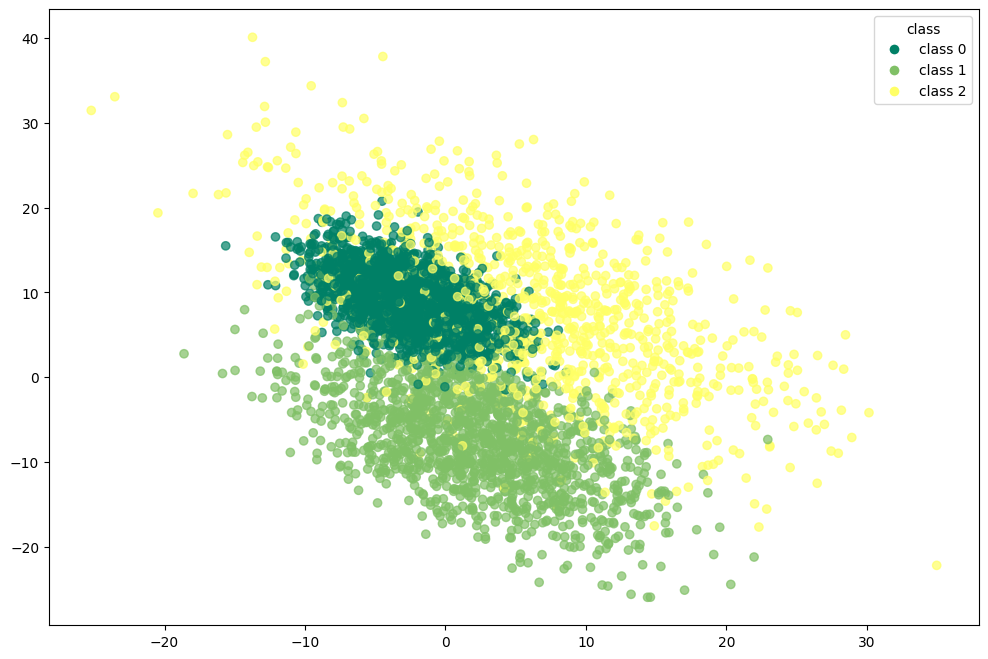

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

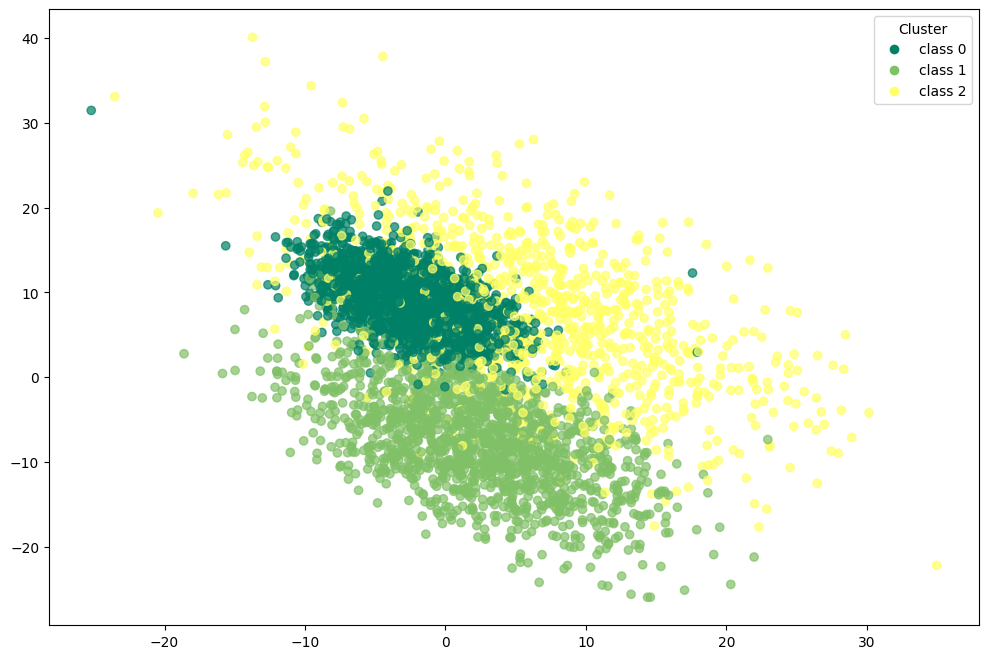

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['pam_pca'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['pam_pca'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [ ]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[2500    0    0]
 [   0 1498    2]
 [   7    9  984]]


In [ ]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2500
           1       0.99      1.00      1.00      1500
           2       1.00      0.98      0.99      1000

    accuracy                           1.00      5000
   macro avg       1.00      0.99      1.00      5000
weighted avg       1.00      1.00      1.00      5000



In [ ]:
adjusted_rand_score(df_pam_pca['target'],df_pam_pca['pam_pca'])

0.9912156144835137

In [ ]:
normalized_mutual_info_score(df_pam_pca['target'],df_pam_pca['pam_pca'])

0.9780451912226538

In [ ]:
silhouette_score(df_pam_pca.drop(columns=['target','pam_pca']).values,df_pam_pca['pam_pca'])

0.42168936707281945

### pam with t-SNE

In [ ]:
initial_medoids = np.random.choice(len(X_tsne),N_CLUSTER,replace=False)

In [ ]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [ ]:
pam_tsne = kmedoids(X_tsne,initial_medoids,metric=metric)

In [ ]:
pam_tsne.process()

In [ ]:
clusters = pam_tsne.get_clusters()

In [ ]:
medoids = pam_tsne.get_medoids()

In [ ]:
labels = np.zeros(len(X_tsne))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [ ]:
df_pam_tsne = corr_dataset.copy()

In [ ]:
df_pam_tsne['pam_tsne'] = labels

In [ ]:
df_pam_tsne

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,pam_tsne
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,2.0
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,1.0
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,0.0
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,1.0
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,1.0
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,1.0
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,0.0
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,0.0


In [ ]:
y_true = df_pam_tsne['target'].values  
y_kmeans = df_pam_tsne['pam_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_tsne['pam_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_tsne['pam_tsne'] == y_true))

accuracy before: 0.5256
accuracy after: 0.5832


In [ ]:
df_pam_tsne

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,pam_tsne
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,0
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,1
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,2
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,1
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,1
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,1
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,2
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,2


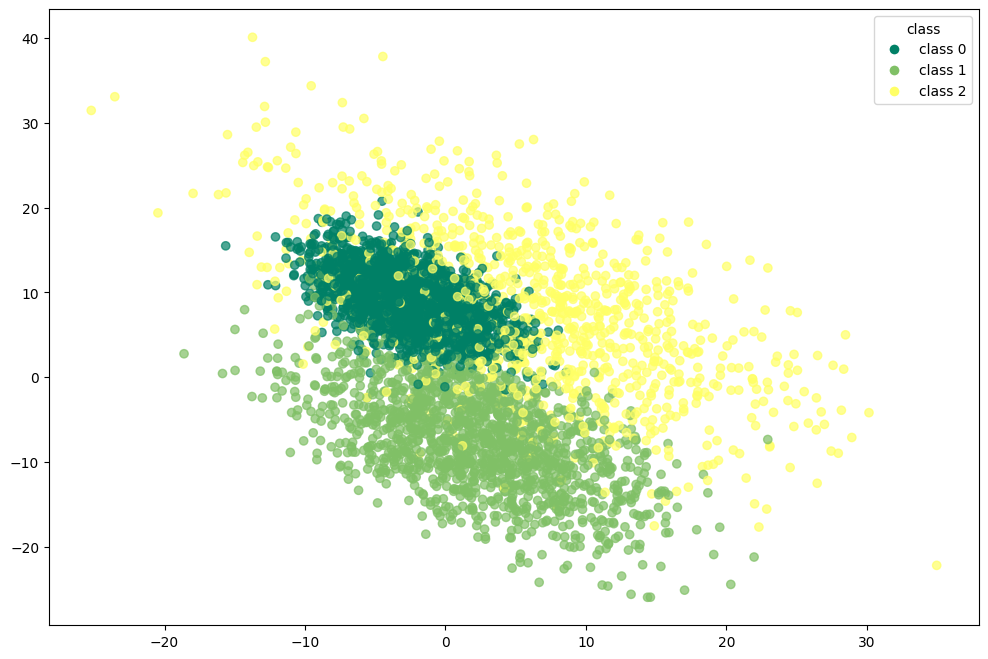

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

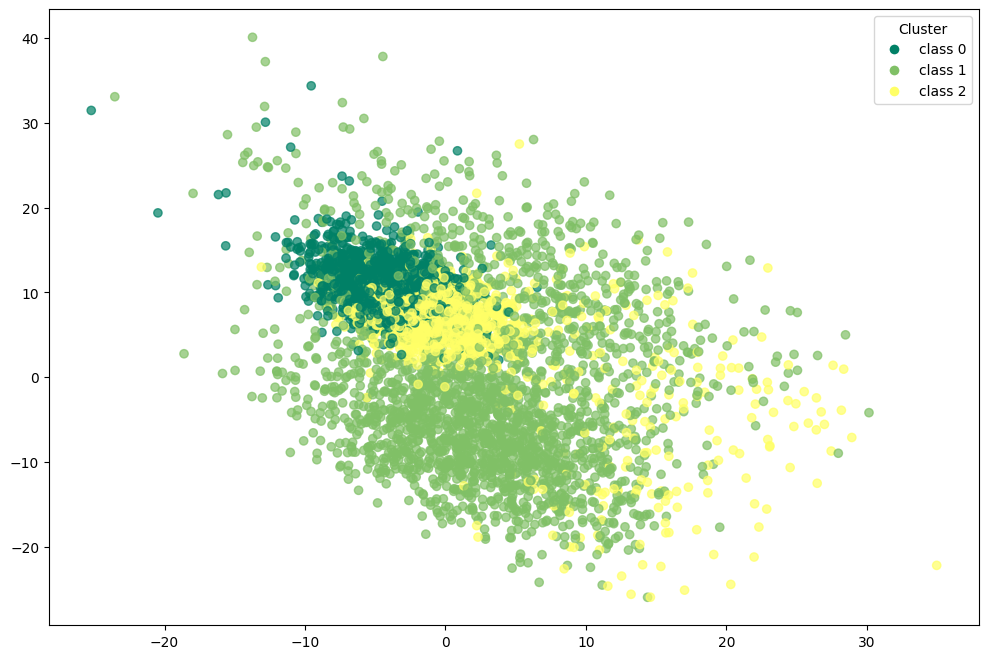

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['pam_tsne'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['pam_tsne'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [ ]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[1310   19 1171]
 [   0 1438   62]
 [  19  813  168]]


In [ ]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       0.99      0.52      0.68      2500
           1       0.63      0.96      0.76      1500
           2       0.12      0.17      0.14      1000

    accuracy                           0.58      5000
   macro avg       0.58      0.55      0.53      5000
weighted avg       0.71      0.58      0.60      5000



In [ ]:
adjusted_rand_score(df_pam_tsne['target'],df_pam_tsne['pam_tsne'])

0.42515954197779904

In [ ]:
normalized_mutual_info_score(df_pam_tsne['target'],df_pam_tsne['pam_tsne'])

0.5163825985002998

In [ ]:
silhouette_score(df_pam_tsne.drop(columns=['target','pam_tsne']).values,df_pam_tsne['pam_tsne'])

0.12767216073187382

### pam with umap

In [ ]:
initial_medoids = np.random.choice(len(X_pca),N_CLUSTER,replace=False)

In [ ]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [ ]:
pam_umap = kmedoids(X_umap,initial_medoids,metric=metric)

In [ ]:
pam_umap.process()

In [ ]:
clusters = pam_umap.get_clusters()

In [ ]:
medoids = pam_umap.get_medoids()

In [ ]:
labels = np.zeros(len(X_umap))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [ ]:
df_pam_umap = corr_dataset.copy()

In [ ]:
df_pam_umap['pam_umap'] = labels

In [ ]:
df_pam_umap

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,pam_umap
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,1.0
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,2.0
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,1.0
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,2.0
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,2.0
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,0.0
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,1.0
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,1.0


In [ ]:
y_true = df_pam_umap['target'].values  
y_kmeans = df_pam_umap['pam_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_umap['pam_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_umap['pam_umap'] == y_true))

accuracy before: 0.0036
accuracy after: 0.996


In [ ]:
df_pam_umap

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,pam_umap
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,0
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,1
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,0
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,1
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,1
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,2
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,0
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,0


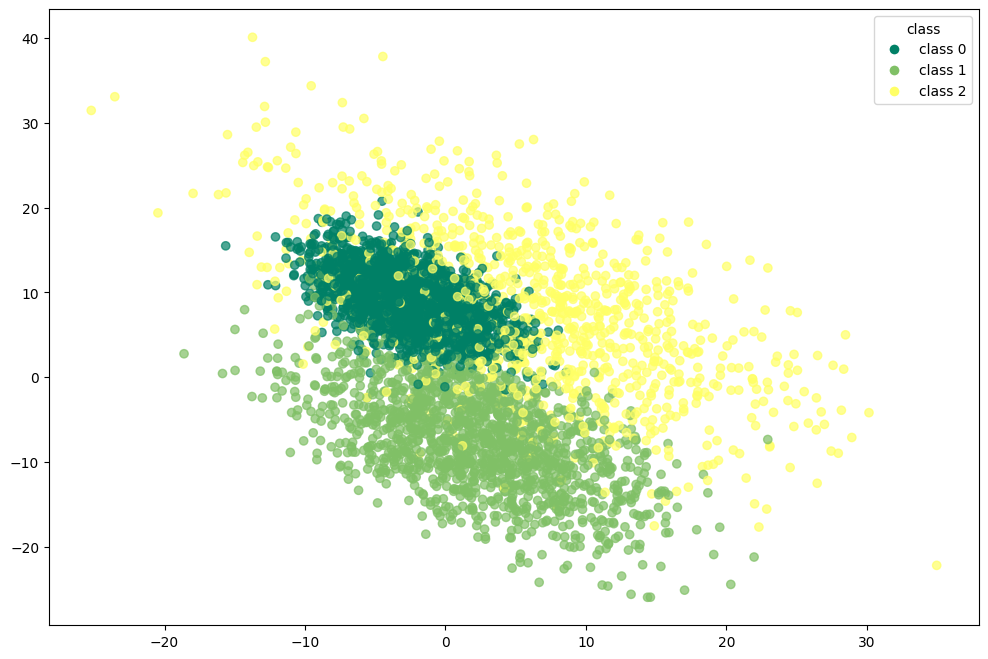

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

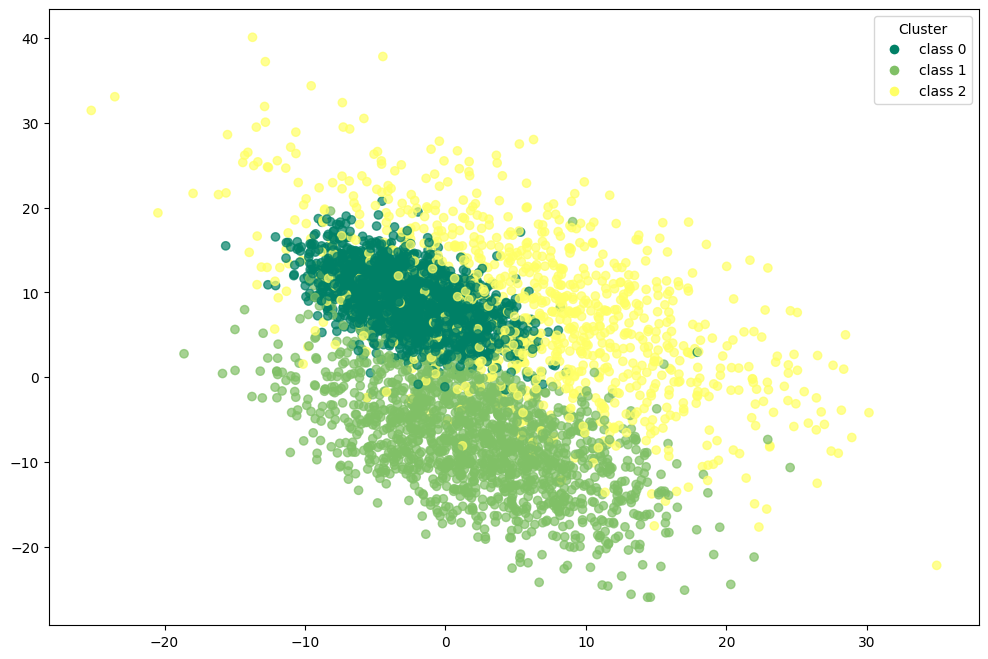

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['pam_umap'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['pam_umap'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [ ]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[2500    0    0]
 [   0 1500    0]
 [   2   18  980]]


In [ ]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2500
           1       0.99      1.00      0.99      1500
           2       1.00      0.98      0.99      1000

    accuracy                           1.00      5000
   macro avg       1.00      0.99      0.99      5000
weighted avg       1.00      1.00      1.00      5000



In [ ]:
adjusted_rand_score(df_pam_umap['target'],df_pam_umap['pam_umap'])

0.9912348363774522

In [ ]:
normalized_mutual_info_score(df_pam_umap['target'],df_pam_umap['pam_umap'])

0.9787576246196595

In [ ]:
silhouette_score(df_pam_umap.drop(columns=['target','pam_umap']).values,df_pam_umap['pam_umap'])

0.4219941435654309

## spectral clustering

In [ ]:
spectral_clustering = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors')

In [ ]:
spectral_clustering.fit(X_values)

,n_clusters,3
,eigen_solver,None
,n_components,None
,random_state,None
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [ ]:
df_spectral = corr_dataset.copy()

In [ ]:
df_spectral['spectral_clustering'] = spectral_clustering.labels_

In [ ]:
df_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,spectral_clustering
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,0
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,1
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,0
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,1
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,1
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,2
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,0
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,0


In [ ]:
y_true = df_spectral['target'].values  
y_spectral = df_spectral['spectral_clustering'].values  

conf_matrix = confusion_matrix(y_true, y_spectral)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_spectral['spectral_clustering'] = np.array([mapping[label] for label in y_spectral])

print("accuracy before:", np.mean(y_spectral == y_true))
print("accuracy after:", np.mean(df_spectral['spectral_clustering'] == y_true))

accuracy before: 0.9956
accuracy after: 0.9956


In [ ]:
df_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,spectral_clustering
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,0
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,1
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,0
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,1
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,1
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,2
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,0
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,0


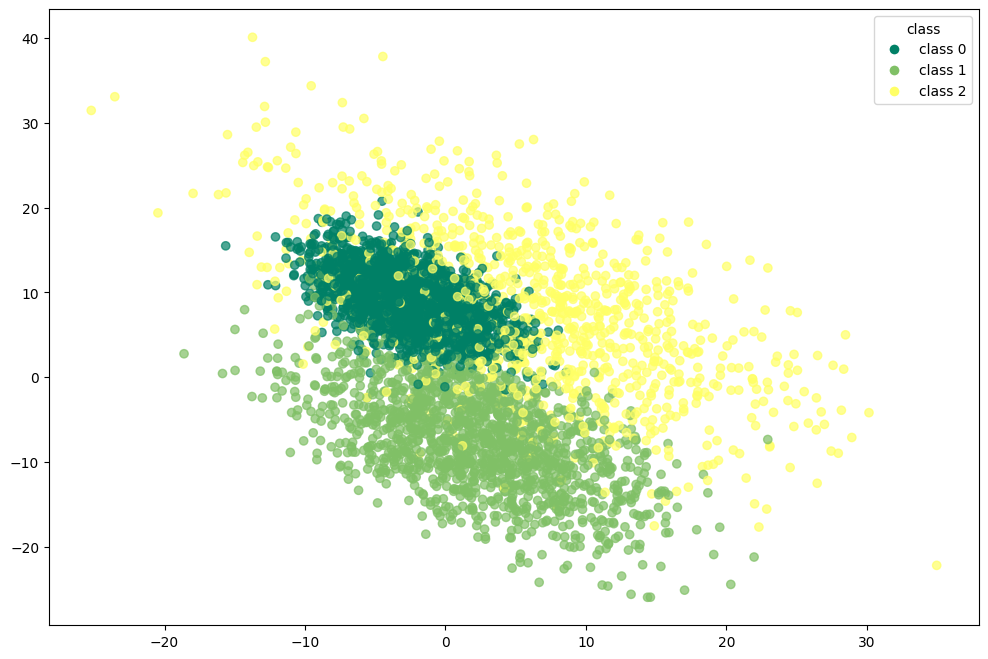

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_spectral.iloc[:, 0],df_spectral.iloc[:, 1], 
                      c=df_spectral['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_spectral['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

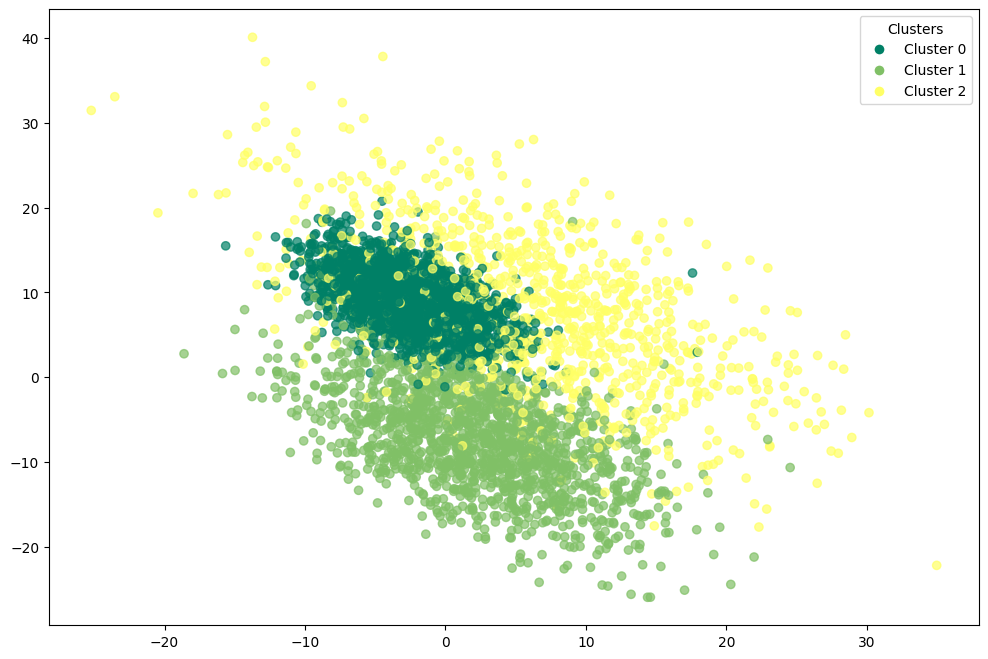

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_spectral.iloc[:, 0], df_spectral.iloc[:, 1], 
                      c=df_spectral['spectral_clustering'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_spectral['spectral_clustering'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_spectral['target'],df_spectral['spectral_clustering']))

[[2500    0    0]
 [   0 1500    0]
 [   3   19  978]]


In [ ]:
print(classification_report(df_spectral['target'],df_spectral['spectral_clustering']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2500
           1       0.99      1.00      0.99      1500
           2       1.00      0.98      0.99      1000

    accuracy                           1.00      5000
   macro avg       1.00      0.99      0.99      5000
weighted avg       1.00      1.00      1.00      5000



In [ ]:
adjusted_rand_score(df_spectral['target'],df_spectral['spectral_clustering'])

0.9902278582347173

In [ ]:
normalized_mutual_info_score(df_spectral['target'],df_spectral['spectral_clustering'])

0.9766869401307863

In [ ]:
silhouette_score(df_spectral.drop(columns=['target','spectral_clustering']).values,df_spectral['spectral_clustering'])

0.42203687898247827

### spectral clustering with pca

In [ ]:
spectral_pca = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors')

In [ ]:
spectral_pca.fit(X_pca)

,n_clusters,3
,eigen_solver,None
,n_components,None
,random_state,None
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [ ]:
df_pca_spectral = corr_dataset.copy()

In [ ]:
df_pca_spectral["spectral_pca"] = spectral_pca.labels_

In [ ]:
df_pca_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,spectral_pca
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,0
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,1
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,0
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,1
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,1
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,2
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,0
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,0


In [ ]:
y_true = df_pca_spectral['target'].values  
y_spectral_pca = df_pca_spectral['spectral_pca'].values  

conf_matrix = confusion_matrix(y_true, y_spectral_pca)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_spectral['spectral_pca'] = np.array([mapping[label] for label in y_spectral_pca])

print("accuracy before:", np.mean(y_spectral_pca == y_true))
print("accuracy after:", np.mean(df_pca_spectral['spectral_pca'] == y_true))

accuracy before: 0.9974
accuracy after: 0.9974


In [ ]:
df_pca_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,spectral_pca
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,0
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,1
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,0
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,1
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,1
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,2
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,0
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,0


In [ ]:
print(confusion_matrix(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

[[2500    0    0]
 [   0 1497    3]
 [   1    9  990]]


In [ ]:
print(classification_report(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2500
           1       0.99      1.00      1.00      1500
           2       1.00      0.99      0.99      1000

    accuracy                           1.00      5000
   macro avg       1.00      1.00      1.00      5000
weighted avg       1.00      1.00      1.00      5000



In [ ]:
adjusted_rand_score(df_pca_spectral['target'],df_pca_spectral['spectral_pca'])

0.9943382504990711

In [ ]:
normalized_mutual_info_score(df_pca_spectral['target'],df_pca_spectral['spectral_pca'])

0.9839531837486908

In [ ]:
silhouette_score(df_pca_spectral.drop(columns=['target','spectral_pca']).values,df_pca_spectral['spectral_pca'])

0.42180253514473787

### spectral clustering with t-SNE

In [ ]:
spectral_tsne = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors')

In [ ]:
spectral_tsne.fit(X_tsne)

,n_clusters,3
,eigen_solver,None
,n_components,None
,random_state,None
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [ ]:
df_tsne_spectral = corr_dataset.copy()

In [ ]:
df_tsne_spectral['spectral_tsne'] = spectral_tsne.labels_

In [ ]:
df_tsne_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,spectral_tsne
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,0
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,1
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,0
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,1
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,1
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,2
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,0
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,0


In [ ]:
y_true = df_tsne_spectral['target'].values  
y_spectral_tsne = df_tsne_spectral['spectral_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_spectral_tsne)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_spectral['spectral_tsne'] = np.array([mapping[label] for label in y_spectral_tsne])

print("accuracy before:", np.mean(y_spectral_tsne == y_true))
print("accuracy after:", np.mean(df_tsne_spectral['spectral_tsne'] == y_true))

accuracy before: 0.997
accuracy after: 0.997


In [ ]:
df_tsne_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,spectral_tsne
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,0
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,1
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,0
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,1
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,1
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,2
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,0
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,0


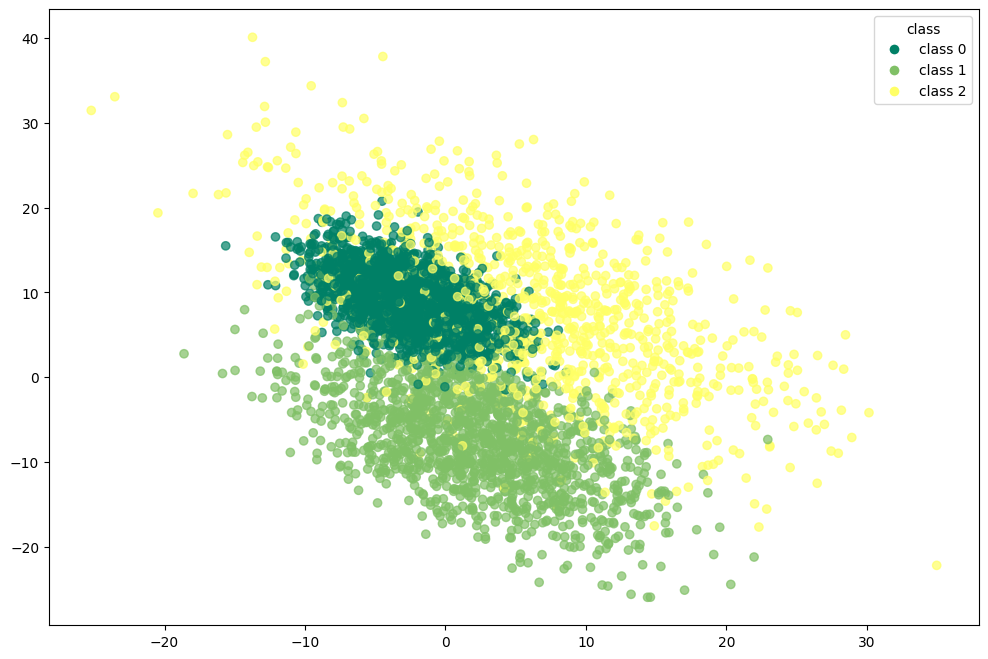

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_spectral.iloc[:, 0], df_tsne_spectral.iloc[:, 1], 
                      c=df_tsne_spectral['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_spectral['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

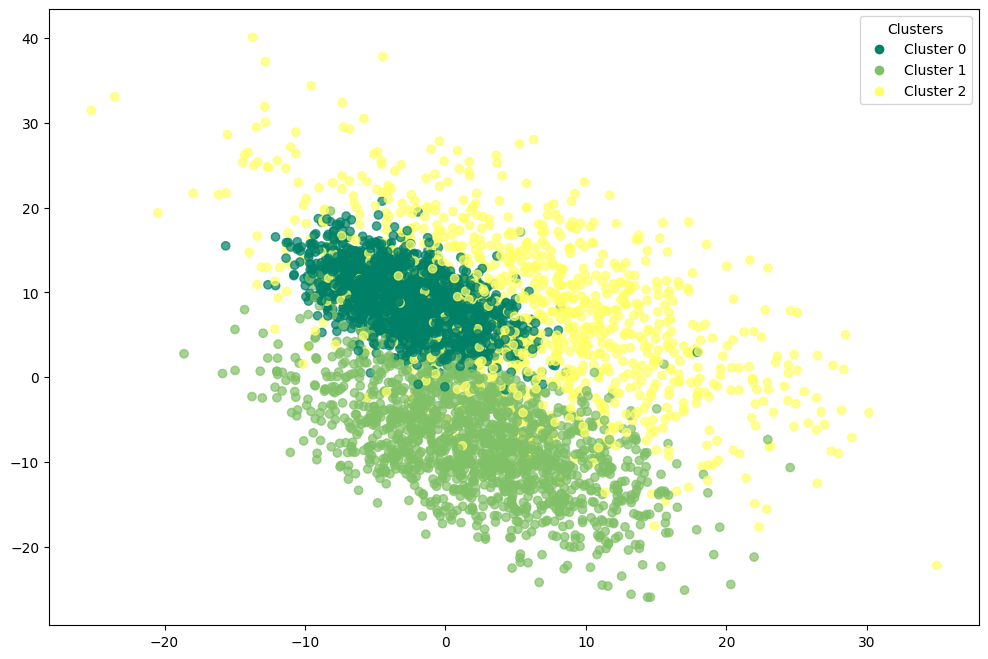

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_spectral.iloc[:, 0], df_tsne_spectral.iloc[:, 1], 
                      c=df_tsne_spectral['spectral_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_spectral['spectral_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

[[2500    0    0]
 [   0 1500    0]
 [   1   14  985]]


In [ ]:
print(classification_report(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2500
           1       0.99      1.00      1.00      1500
           2       1.00      0.98      0.99      1000

    accuracy                           1.00      5000
   macro avg       1.00      0.99      1.00      5000
weighted avg       1.00      1.00      1.00      5000



In [ ]:
adjusted_rand_score(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne'])

0.9934995089625674

In [ ]:
normalized_mutual_info_score(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne'])

0.9834899806109136

In [ ]:
silhouette_score(df_tsne_spectral.drop(columns=['target','spectral_tsne']).values,df_tsne_spectral['spectral_tsne'])

0.4217468859707115

### spectral clustering with umap

In [ ]:
spectral_umap = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors')

In [ ]:
spectral_umap.fit(X_umap)

,n_clusters,3
,eigen_solver,None
,n_components,None
,random_state,None
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [ ]:
df_umap_spectral = corr_dataset.copy()

In [ ]:
df_umap_spectral['spectral_umap'] = spectral_umap.labels_

In [ ]:
df_umap_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,spectral_umap
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,1
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,0
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,1
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,0
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,0
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,1
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,1
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,1


In [ ]:
y_true = df_umap_spectral['target'].values  
y_spectral = df_umap_spectral['spectral_umap'].values  

conf_matrix = confusion_matrix(y_true, y_spectral)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_spectral['spectral_umap'] = np.array([mapping[label] for label in y_spectral])

print("accuracy before:", np.mean(y_spectral == y_true))
print("accuracy after:", np.mean(df_umap_spectral['spectral_umap'] == y_true))

accuracy before: 0.0
accuracy after: 0.7078


In [ ]:
df_umap_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,spectral_umap
0,-1.117284,12.769529,4.818748,-1.010676,-4.660035,-8.994879,-7.985400,3.676944,2.013149,0.306795,...,5.555746,-8.040473,-1.250939,2.496801,-1.208819,-1.286095,-1.782923,-0.014669,0,2
1,-1.599273,-2.477363,-14.204643,-1.171356,-7.589087,5.749130,-12.530917,1.858511,-4.197369,-9.031794,...,-12.699137,15.001160,9.435906,6.402276,-6.073678,-5.485234,5.343118,-7.190501,1,1
2,-0.059156,6.694670,0.576694,2.933397,1.079260,-2.784943,-12.939300,1.952393,4.561514,1.585510,...,0.446468,-6.234350,-10.370071,-4.841885,-1.618642,2.702042,-4.773225,-3.020284,0,2
3,-1.923815,-7.456378,-9.083827,-6.885995,-0.298490,-3.720082,4.398345,19.726309,2.966530,-17.547403,...,7.286450,15.411189,16.449604,5.258685,-12.937051,-6.656770,15.406053,-1.188379,1,1
4,-1.685893,5.130250,7.039103,1.962388,-4.060430,1.424118,-12.416053,5.343901,1.694932,6.353853,...,2.471934,-13.308869,-11.305934,-10.111555,-1.448090,0.763590,-1.937730,-8.803762,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.204280,-2.566272,4.884044,-4.455109,-7.187601,0.764049,-9.265247,6.058907,18.468361,-8.575452,...,-10.525429,7.135850,7.544239,16.059353,-3.892624,-11.359392,5.600957,3.102281,1,1
4996,8.032208,3.887804,-3.657944,-18.449782,2.524126,-0.849028,-3.446049,5.090964,-8.179129,6.656620,...,-10.504318,-6.849323,-5.068358,-10.890879,7.867948,13.789234,-18.193493,5.572842,2,2
4997,-4.140882,7.718914,2.483123,2.386520,-6.691615,-6.558454,-8.139921,1.921473,6.029145,4.950326,...,3.813297,0.274792,-5.576327,-2.147094,-0.844849,3.063452,-0.610610,-4.859368,0,2
4998,-0.310335,10.406995,6.098641,-3.775971,-6.240335,-7.300335,-8.376395,7.434744,5.908455,9.243419,...,7.893405,2.850390,-6.647549,-3.206462,-5.303415,-0.601371,-2.929148,-5.656470,0,2


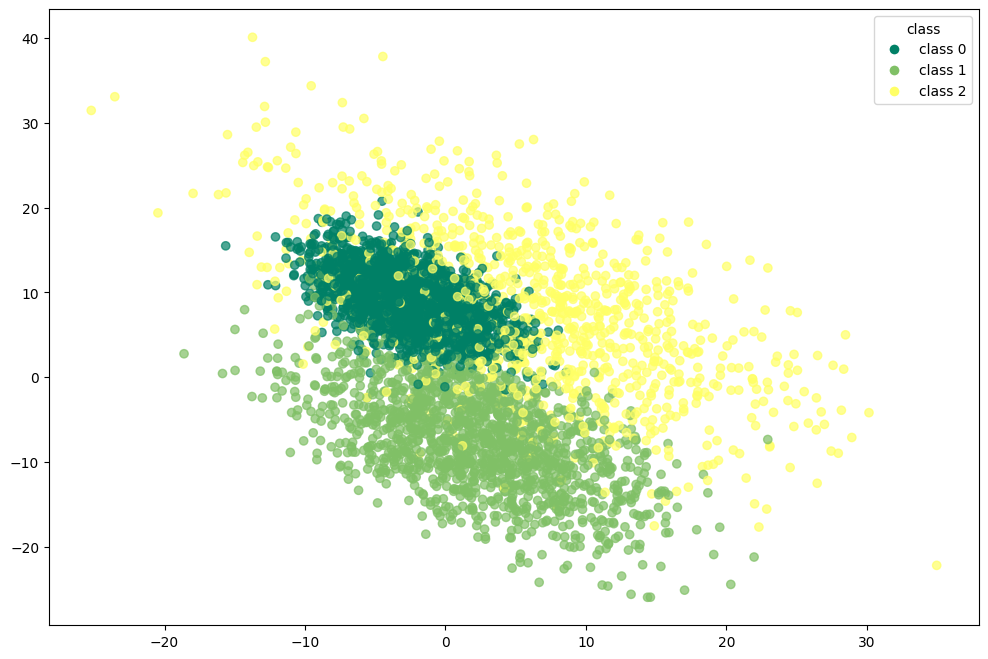

In [ ]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_spectral.iloc[:, 0], df_umap_spectral.iloc[:, 1], 
                      c=df_umap_spectral['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_spectral['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',    
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

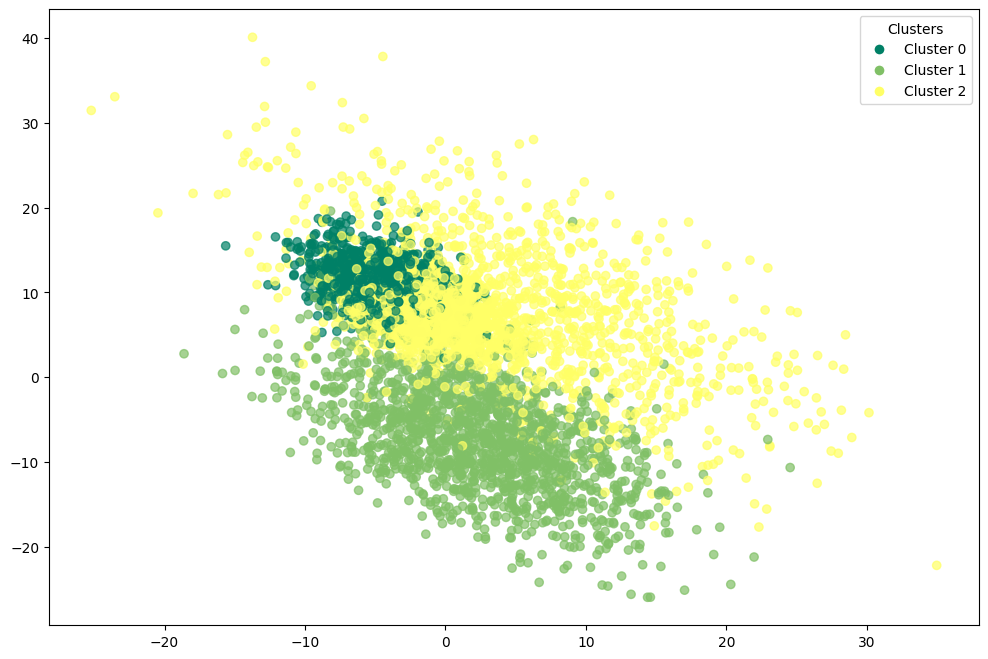

In [ ]:
plt.figure(figsize=(12,8)) 
scatter = plt.scatter(df_umap_spectral.iloc[:, 0], df_umap_spectral.iloc[:, 1], 
                      c=df_umap_spectral['spectral_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_spectral['spectral_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [ ]:
print(confusion_matrix(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

[[1057    0 1443]
 [   0 1500    0]
 [   0   18  982]]


In [ ]:
print(classification_report(df_umap_spectral['target'],df_umap_spectral['spectral_umap'])) 

              precision    recall  f1-score   support

           0       1.00      0.42      0.59      2500
           1       0.99      1.00      0.99      1500
           2       0.40      0.98      0.57      1000

    accuracy                           0.71      5000
   macro avg       0.80      0.80      0.72      5000
weighted avg       0.88      0.71      0.71      5000



In [ ]:
adjusted_rand_score(df_umap_spectral['target'],df_umap_spectral['spectral_umap'])

0.4906562725239661

In [ ]:
normalized_mutual_info_score(df_umap_spectral['target'],df_umap_spectral['spectral_umap'])

0.6593361566180337

In [ ]:
silhouette_score(df_umap_spectral.drop(columns=['target','spectral_umap']).values,df_umap_spectral['spectral_umap'])

0.10097605104263618

# overall results

## overall results k-means

### basic

In [ ]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2500
           1       0.74      0.73      0.73      1500
           2       0.59      0.58      0.58      1000

    accuracy                           0.83      5000
   macro avg       0.77      0.77      0.77      5000
weighted avg       0.83      0.83      0.83      5000



In [ ]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[2500    0    0]
 [   0 1094  406]
 [  32  390  578]]


### + pca

In [ ]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2500
           1       0.99      1.00      0.99      1500
           2       1.00      0.97      0.98      1000

    accuracy                           0.99      5000
   macro avg       0.99      0.99      0.99      5000
weighted avg       0.99      0.99      0.99      5000



In [ ]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[2500    0    0]
 [   0 1497    3]
 [  12   18  970]]


### + t-SNE

In [ ]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      0.56      0.72      2500
           1       0.65      0.88      0.75      1500
           2       0.19      0.29      0.23      1000

    accuracy                           0.60      5000
   macro avg       0.61      0.58      0.56      5000
weighted avg       0.73      0.60      0.63      5000



In [ ]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

[[1405    5 1090]
 [   0 1316  184]
 [   0  707  293]]


### + UMAP

In [ ]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2500
           1       0.99      1.00      0.99      1500
           2       1.00      0.98      0.99      1000

    accuracy                           1.00      5000
   macro avg       1.00      0.99      0.99      5000
weighted avg       1.00      1.00      1.00      5000



In [ ]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

[[2500    0    0]
 [   0 1500    0]
 [   2   18  980]]


## overall results Birch

### basic

In [ ]:
print(classification_report(df_birch['target'],df_birch['birch']))

              precision    recall  f1-score   support

           0       0.78      1.00      0.88      2500
           1       1.00      1.00      1.00      1500
           2       1.00      0.29      0.44      1000

    accuracy                           0.86      5000
   macro avg       0.92      0.76      0.77      5000
weighted avg       0.89      0.86      0.83      5000



In [ ]:
print(confusion_matrix(df_birch['target'],df_birch['birch']))

[[2500    0    0]
 [   2 1497    1]
 [ 707    7  286]]


### + pca

In [ ]:
print(classification_report(df_pca_birch['target'],df_pca_birch['birch_pca']))

              precision    recall  f1-score   support

           0       0.56      1.00      0.72      2500
           1       0.72      0.20      0.31      1500
           2       1.00      0.10      0.18      1000

    accuracy                           0.58      5000
   macro avg       0.76      0.43      0.40      5000
weighted avg       0.70      0.58      0.49      5000



In [ ]:
print(confusion_matrix(df_pca_birch['target'],df_pca_birch['birch_pca']))

[[2500    0    0]
 [1204  296    0]
 [ 785  114  101]]


### + t-SNE

In [ ]:
print(classification_report(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      0.55      0.71      2500
           1       0.60      1.00      0.75      1500
           2       0.00      0.00      0.00      1000

    accuracy                           0.58      5000
   macro avg       0.53      0.52      0.49      5000
weighted avg       0.68      0.58      0.58      5000



In [ ]:
print(confusion_matrix(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])) 

[[1387    1 1112]
 [   0 1500    0]
 [   1  998    1]]


### + UMAP

In [ ]:
print(classification_report(df_umap_birch['target'],df_umap_birch['birch_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2500
           1       0.99      1.00      0.99      1500
           2       1.00      0.98      0.99      1000

    accuracy                           1.00      5000
   macro avg       1.00      0.99      0.99      5000
weighted avg       1.00      1.00      1.00      5000



In [ ]:
print(confusion_matrix(df_umap_birch['target'],df_umap_birch['birch_umap'])) 

[[2500    0    0]
 [   0 1500    0]
 [   2   18  980]]


## overall results GMM

### basic

In [ ]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2500
           1       1.00      1.00      1.00      1500
           2       1.00      1.00      1.00      1000

    accuracy                           1.00      5000
   macro avg       1.00      1.00      1.00      5000
weighted avg       1.00      1.00      1.00      5000



In [ ]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[2500    0    0]
 [   0 1500    0]
 [   0    0 1000]]


### + pca

In [ ]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2500
           1       1.00      1.00      1.00      1500
           2       1.00      0.99      0.99      1000

    accuracy                           1.00      5000
   macro avg       1.00      1.00      1.00      5000
weighted avg       1.00      1.00      1.00      5000



In [ ]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[2500    0    0]
 [   0 1497    3]
 [   0    7  993]]


### + t-SNE

In [ ]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2500
           1       0.98      1.00      0.99      1500
           2       1.00      0.97      0.99      1000

    accuracy                           0.99      5000
   macro avg       0.99      0.99      0.99      5000
weighted avg       0.99      0.99      0.99      5000



In [ ]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[2500    0    0]
 [   0 1500    0]
 [   1   26  973]]


### + UMAP

In [ ]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2500
           1       0.99      1.00      0.99      1500
           2       1.00      0.98      0.99      1000

    accuracy                           1.00      5000
   macro avg       1.00      0.99      0.99      5000
weighted avg       1.00      1.00      1.00      5000



In [ ]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[2500    0    0]
 [   0 1500    0]
 [   2   18  980]]


## overall results pam

### basic

In [ ]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[2500    0    0]
 [   0  900  600]
 [ 233  455  312]]


In [ ]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       0.91      1.00      0.96      2500
           1       0.66      0.60      0.63      1500
           2       0.34      0.31      0.33      1000

    accuracy                           0.74      5000
   macro avg       0.64      0.64      0.64      5000
weighted avg       0.73      0.74      0.73      5000



### + pca

In [ ]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[2500    0    0]
 [   0 1498    2]
 [   7    9  984]]


In [ ]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2500
           1       0.99      1.00      1.00      1500
           2       1.00      0.98      0.99      1000

    accuracy                           1.00      5000
   macro avg       1.00      0.99      1.00      5000
weighted avg       1.00      1.00      1.00      5000



### + t-SNE

In [ ]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[1310   19 1171]
 [   0 1438   62]
 [  19  813  168]]


In [ ]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       0.99      0.52      0.68      2500
           1       0.63      0.96      0.76      1500
           2       0.12      0.17      0.14      1000

    accuracy                           0.58      5000
   macro avg       0.58      0.55      0.53      5000
weighted avg       0.71      0.58      0.60      5000



### + umap

In [ ]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[2500    0    0]
 [   0 1500    0]
 [   2   18  980]]


In [ ]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2500
           1       0.99      1.00      0.99      1500
           2       1.00      0.98      0.99      1000

    accuracy                           1.00      5000
   macro avg       1.00      0.99      0.99      5000
weighted avg       1.00      1.00      1.00      5000



## overall results spectral clustering

### basic

In [ ]:
print(confusion_matrix(df_spectral['target'],df_spectral['spectral_clustering']))

[[2500    0    0]
 [   0 1500    0]
 [   3   19  978]]


In [ ]:
print(classification_report(df_spectral['target'],df_spectral['spectral_clustering']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2500
           1       0.99      1.00      0.99      1500
           2       1.00      0.98      0.99      1000

    accuracy                           1.00      5000
   macro avg       1.00      0.99      0.99      5000
weighted avg       1.00      1.00      1.00      5000



### + pca

In [ ]:
print(confusion_matrix(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

[[2500    0    0]
 [   0 1497    3]
 [   1    9  990]]


In [ ]:
print(classification_report(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2500
           1       0.99      1.00      1.00      1500
           2       1.00      0.99      0.99      1000

    accuracy                           1.00      5000
   macro avg       1.00      1.00      1.00      5000
weighted avg       1.00      1.00      1.00      5000



### + t-SNE

In [ ]:
print(confusion_matrix(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

[[2500    0    0]
 [   0 1500    0]
 [   1   14  985]]


In [ ]:
print(classification_report(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2500
           1       0.99      1.00      1.00      1500
           2       1.00      0.98      0.99      1000

    accuracy                           1.00      5000
   macro avg       1.00      0.99      1.00      5000
weighted avg       1.00      1.00      1.00      5000



### + umap

In [ ]:
print(confusion_matrix(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

[[1057    0 1443]
 [   0 1500    0]
 [   0   18  982]]


In [ ]:
print(classification_report(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

              precision    recall  f1-score   support

           0       1.00      0.42      0.59      2500
           1       0.99      1.00      0.99      1500
           2       0.40      0.98      0.57      1000

    accuracy                           0.71      5000
   macro avg       0.80      0.80      0.72      5000
weighted avg       0.88      0.71      0.71      5000



# external measures - overall results 

## k-means

In [ ]:
scores = evaluate_clustering(df_kmeans.drop(['target','k_means'],axis=1).values, df_kmeans['target'], df_kmeans['k_means'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.756
NMI: 0.673
Silhouette: 0.391


## k-means + pca

In [ ]:
scores = evaluate_clustering(df_pca_kmeans.drop(['target','kmeans_pca'],axis=1).values, df_pca_kmeans['target'], df_pca_kmeans['kmeans_pca'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.984
NMI: 0.964
Silhouette: 0.421


## k-means + tsne

In [ ]:
scores = evaluate_clustering(df_tsne_kmeans.drop(['target','kmeans_tsne'],axis=1).values, df_tsne_kmeans['target'], df_tsne_kmeans['kmeans_tsne'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.392
NMI: 0.477
Silhouette: 0.133


## k-means + umap

In [ ]:
scores = evaluate_clustering(df_umap_kmeans.drop(['target','kmeans_umap'],axis=1).values, df_umap_kmeans['target'], df_umap_kmeans['kmeans_umap'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.991
NMI: 0.979
Silhouette: 0.422


##  Birch 

In [ ]:
scores = evaluate_clustering(df_birch.drop(['target','birch'],axis=1).values, df_birch['target'], df_birch['birch'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.681
NMI: 0.737
Silhouette: 0.357


## Birch + pca

In [ ]:
scores = evaluate_clustering(df_pca_birch.drop(['target','birch_pca'],axis=1).values, df_pca_birch['target'], df_pca_birch['birch_pca'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.097
NMI: 0.139
Silhouette: 0.239


## Birch + tsne

In [ ]:
scores = evaluate_clustering(df_tsne_birch.drop(['target','birch_tsne'],axis=1).values, df_tsne_birch['target'], df_tsne_birch['birch_tsne'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.481
NMI: 0.666
Silhouette: 0.118


## Birch + umap

In [ ]:
scores = evaluate_clustering(df_umap_birch.drop(['target','birch_umap'],axis=1).values, df_umap_birch['target'], df_umap_birch['birch_umap'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.991
NMI: 0.979
Silhouette: 0.422


## GMM

In [ ]:
scores = evaluate_clustering(df_gmm.drop(['target','gmm'],axis=1).values, df_gmm['target'], df_gmm['gmm'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 1.000
NMI: 1.000
Silhouette: 0.422


## GMM + pca

In [ ]:
scores = evaluate_clustering(df_pca_gmm.drop(['target','gmm_pca'],axis=1).values, df_pca_gmm['target'], df_pca_gmm['gmm_pca'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.996
NMI: 0.988
Silhouette: 0.422


## GMM + tsne

In [ ]:
scores = evaluate_clustering(df_tsne_gmm.drop(['target','gmm_tsne'],axis=1).values, df_tsne_gmm['target'], df_tsne_gmm['gmm_tsne'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.988
NMI: 0.974
Silhouette: 0.422


## GMM + umap

In [ ]:
scores = evaluate_clustering(df_umap_gmm.drop(['target','gmm_umap'],axis=1).values, df_umap_gmm['target'], df_umap_gmm['gmm_umap'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.991
NMI: 0.979
Silhouette: 0.422


## pam

In [ ]:
scores = evaluate_clustering(df_pam.drop(['target','pam'],axis=1).values, df_pam['target'], df_pam['pam'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.658
NMI: 0.573
Silhouette: 0.367


## pam + pca

In [ ]:
scores = evaluate_clustering(df_pam_pca.drop(['target','pam_pca'],axis=1).values, df_pam_pca['target'], df_pam_pca['pam_pca'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.991
NMI: 0.978
Silhouette: 0.422


## pam + tsne

In [ ]:
scores = evaluate_clustering(df_pam_tsne.drop(['target','pam_tsne'],axis=1).values, df_pam_tsne['target'], df_pam_tsne['pam_tsne'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.425
NMI: 0.516
Silhouette: 0.128


## pca + umap

In [ ]:
scores = evaluate_clustering(df_pam_umap.drop(['target','pam_umap'],axis=1).values, df_pam_umap['target'], df_pam_umap['pam_umap'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.991
NMI: 0.979
Silhouette: 0.422


## spectral clustering

In [ ]:
scores = evaluate_clustering(df_spectral.drop(['target','spectral_clustering'],axis=1).values, df_spectral['target'], df_spectral['spectral_clustering'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.990
NMI: 0.977
Silhouette: 0.422


## spectral clustering + pca

In [ ]:
scores = evaluate_clustering(df_pca_spectral.drop(['target','spectral_pca'],axis=1).values, df_pca_spectral['target'], df_pca_spectral['spectral_pca'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.994
NMI: 0.984
Silhouette: 0.422


## spectral clustering + tsne

In [ ]:
scores = evaluate_clustering(df_tsne_spectral.drop(['target','spectral_tsne'],axis=1).values, df_tsne_spectral['target'], df_tsne_spectral['spectral_tsne'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.993
NMI: 0.983
Silhouette: 0.422


## spectral clustering + umap

In [ ]:
scores = evaluate_clustering(df_umap_spectral.drop(['target','spectral_umap'],axis=1).values, df_umap_spectral['target'], df_umap_spectral['spectral_umap'])

In [ ]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.491
NMI: 0.659
Silhouette: 0.101


# final output

In [ ]:
results = {}

def evaluate_and_store(name, X, y_true, y_pred):
    scores = evaluate_clustering(X, y_true, y_pred)
    results[name] = scores

# k-means
evaluate_and_store("k-means",
                   df_kmeans.drop(['target','k_means'],axis=1).values,
                   df_kmeans['target'], df_kmeans['k_means'])

evaluate_and_store("k-means + pca",
                   df_pca_kmeans.drop(['target','kmeans_pca'],axis=1).values,
                   df_pca_kmeans['target'], df_pca_kmeans['kmeans_pca'])

evaluate_and_store("k-means + tsne",
                   df_tsne_kmeans.drop(['target','kmeans_tsne'],axis=1).values,
                   df_tsne_kmeans['target'], df_tsne_kmeans['kmeans_tsne'])

evaluate_and_store("k-means + umap",
                   df_umap_kmeans.drop(['target','kmeans_umap'],axis=1).values,
                   df_umap_kmeans['target'], df_umap_kmeans['kmeans_umap'])

# Birch
evaluate_and_store("Birch",
                   df_birch.drop(['target','birch'],axis=1).values,
                   df_birch['target'], df_birch['birch'])

evaluate_and_store("Birch + pca",
                   df_pca_birch.drop(['target','birch_pca'],axis=1).values,
                   df_pca_birch['target'], df_pca_birch['birch_pca'])

evaluate_and_store("Birch + tsne",
                   df_tsne_birch.drop(['target','birch_tsne'],axis=1).values,
                   df_tsne_birch['target'], df_tsne_birch['birch_tsne'])

evaluate_and_store("Birch + umap",
                   df_umap_birch.drop(['target','birch_umap'],axis=1).values,
                   df_umap_birch['target'], df_umap_birch['birch_umap'])

# GMM
evaluate_and_store("GMM",
                   df_gmm.drop(['target','gmm'],axis=1).values,
                   df_gmm['target'], df_gmm['gmm'])

evaluate_and_store("GMM + pca",
                   df_pca_gmm.drop(['target','gmm_pca'],axis=1).values,
                   df_pca_gmm['target'], df_pca_gmm['gmm_pca'])

evaluate_and_store("GMM + tsne",
                   df_tsne_gmm.drop(['target','gmm_tsne'],axis=1).values,
                   df_tsne_gmm['target'], df_tsne_gmm['gmm_tsne'])

evaluate_and_store("GMM + umap",
                   df_umap_gmm.drop(['target','gmm_umap'],axis=1).values,
                   df_umap_gmm['target'], df_umap_gmm['gmm_umap'])

# PAM
evaluate_and_store("PAM",
                   df_pam.drop(['target','pam'],axis=1).values,
                   df_pam['target'], df_pam['pam'])

evaluate_and_store("PAM + pca",
                   df_pam_pca.drop(['target','pam_pca'],axis=1).values,
                   df_pam_pca['target'], df_pam_pca['pam_pca'])

evaluate_and_store("PAM + tsne",
                   df_pam_tsne.drop(['target','pam_tsne'],axis=1).values,
                   df_pam_tsne['target'], df_pam_tsne['pam_tsne'])

evaluate_and_store("PAM + umap",
                   df_pam_umap.drop(['target','pam_umap'],axis=1).values,
                   df_pam_umap['target'], df_pam_umap['pam_umap'])

# Spectral clustering
evaluate_and_store("Spectral Clustering",
                   df_spectral.drop(['target','spectral_clustering'],axis=1).values,
                   df_spectral['target'], df_spectral['spectral_clustering'])

evaluate_and_store("Spectral Clustering + pca",
                   df_pca_spectral.drop(['target','spectral_pca'],axis=1).values,
                   df_pca_spectral['target'], df_pca_spectral['spectral_pca'])

evaluate_and_store("Spectral Clustering + tsne",
                   df_tsne_spectral.drop(['target','spectral_tsne'],axis=1).values,
                   df_tsne_spectral['target'], df_tsne_spectral['spectral_tsne'])

evaluate_and_store("Spectral Clustering + umap",
                   df_umap_spectral.drop(['target','spectral_umap'],axis=1).values,
                   df_umap_spectral['target'], df_umap_spectral['spectral_umap'])


df_results = pd.DataFrame(results).T  
df_results = df_results.round(3)    

print(df_results)

                              ARI    NMI  Silhouette
k-means                     0.756  0.673       0.391
k-means + pca               0.984  0.964       0.421
k-means + tsne              0.392  0.477       0.133
k-means + umap              0.991  0.979       0.422
Birch                       0.681  0.737       0.357
Birch + pca                 0.097  0.139       0.239
Birch + tsne                0.481  0.666       0.118
Birch + umap                0.991  0.979       0.422
GMM                         1.000  1.000       0.422
GMM + pca                   0.996  0.988       0.422
GMM + tsne                  0.988  0.974       0.422
GMM + umap                  0.991  0.979       0.422
PAM                         0.658  0.573       0.367
PAM + pca                   0.991  0.978       0.422
PAM + tsne                  0.425  0.516       0.128
PAM + umap                  0.991  0.979       0.422
Spectral Clustering         0.990  0.977       0.422
Spectral Clustering + pca   0.994  0.984      

In [ ]:
if N_SAMPLE == 5000 and N_FEATURES == 20:
    folder = "5000_20"
elif N_SAMPLE == 10000 and N_FEATURES == 10:
    folder = "10000_10"
elif N_SAMPLE == 20000 and N_FEATURES == 5:
    folder = "20000_5"

os.makedirs(folder, exist_ok=True)

filename = f"X_{N_CLUSTER}_{CORRELATION}_{NOISE_STD}.csv"
filepath = os.path.join(folder, filename)
df_results.to_csv(filepath, index=True)